In [1]:
#use wdtools_env_pip environment

import numpy as np
from math import log10, floor
from bisect import bisect_left
from scipy import stats
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib.colors as pltcolors
plt.style.use('Software/stefan.mplstyle')

import pandas as pd
pd.set_option('display.max_columns', None)
# Suppress SettingWithCopyWarnings
pd.options.mode.chained_assignment = None  # default='warn'

#for machine learning
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.models import load_model


# This notebook trains a machine learning method to reconstruct the correlation length in the simulation with all noise sources added (simulation=8)
- Use a deep learning approach with a convolutional neural network. CNNs are designed to automatically learn hierarchical features from raw data (usually images), so they are well suited to detect the peak/drop-off structure in the Moran's I x Z-Score curve that is useful in identifying the correlation length without me needing to do manual feature extraction. 
    - Use just the 1D Moran's I x Z-Score curve, don't include the distance array since the CNN will learn that scale from the labeled true correlation length
    - Don't cut the peak at small distances since the CNN should learn that feature doesn't necessarily drive the labeled true correlation length

# Import the simulation outputs

In [2]:
def get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type,nonzero_weight_cut=20,plot=True):
    #read back in measurements
    noise_label="".join(noise_effect_array)
    
    #sample_type='training','testing', or 'bootstrap'
    if sample_type=='training':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']
        
    if sample_type=='testing':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']

    Ws = npzfile['Ws']
    final_distances = npzfile['distances']
    moransIs = npzfile['moransIs'] 
    expectations = npzfile['expectations']
    variances = npzfile['variances']
    zscores = npzfile['zscores']
    
    mult=[]
    for i in range(len(moransIs)):
        mult.append(moransIs[i]*zscores[i])
        
    #cut to make sure have enough nonzero weights for valid results
    index = bisect_left(Ws, nonzero_weight_cut)
    
    if plot:
        #plot
        fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(6,15),sharex=True)
        ax1.plot(final_distances,moransIs)
        ax1.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax1.axvline(corr_length,color='green',label='True Correlation\nLength')
        ax1.axhline(expectations[0],color='red',label='No Correlation')
        ax1.set_ylabel("Moran's I")
        ax1.legend()

        ax2.plot(final_distances,zscores)
        ax2.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax2.axvline(corr_length,color='green')
        ax2.set_ylabel('Z-score')

        ax3.plot(final_distances,mult)
        ax3.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax3.axvline(corr_length,color='green')
        ax3.set_xlabel('Distance Cut')
        ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

        plt.subplots_adjust(wspace = 0,hspace=0)
        plt.show()
    
    return(final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index)


In [3]:
def count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type):
    
    #turn into combined simulation parameter array
    simulation_params=[]
    for corr_length in corr_lengths:
        for epsilon in epsilons:
            simulation_params.append([corr_length,epsilon])
            
    noise_label="".join(noise_effect_array)
    
    simulation_params_not_run=[]
    simulation_params_run=[]
    
    #check if each training data simulation has been run
    for i in range(len(simulation_params)):
        simulation=simulation_params[i]
        corr_length=simulation[0]
        epsilon=simulation[1]
        try:
            if sample_type=='training':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            if sample_type=='testing':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            simulation_params_run.append(simulation)
            #print('Simulation exists, ', simulation)
        except:
            simulation_params_not_run.append(simulation)
            #print('No simulation exists, ', simulation)

    return(simulation_params_run,simulation_params_not_run)


In [4]:
#for training data
corr_lengths=np.round(np.append(np.linspace(1,98,30)[1:],np.logspace(2,3,num=100)[1:-1]),2)
def round_sig(x,sig):
    return round(x, sig-int(floor(log10(abs(x))))-1)
epsilons_init=np.append(np.logspace(-10,-1,num=20),np.linspace(0.1,0.5,4)[1:])
epsilons=[]
for e in epsilons_init:
    epsilons.append(round_sig(e,2))

#for testing data
corr_lengths_testing=[10,25,50,75,100,150,200,250,300,400,500,600,700,800,900,1000]
epsilons_testing=[1e-10,1e-7,1e-4,0.001,0.005,0.01,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]

In [5]:
sample_size=10207
noise_effect_array=['1','1','1','1','1']
improvement_factor=1
effect_strength=1
chance_companion=0.01
remove_likely_binaries='1'

#count how many simulations have been run

simulation_params_run,simulation_params_not_run=count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

print('training')
print(len(simulation_params_run))
print(len(simulation_params_not_run))
print('')

simulation_params_run_testing,simulation_params_not_run_testing=count_simulations(corr_lengths_testing,epsilons_testing,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'testing')
print('testing')
print(len(simulation_params_run_testing))
print(len(simulation_params_not_run_testing))

training
2921
0

testing
256
0


112.33 5.5e-06


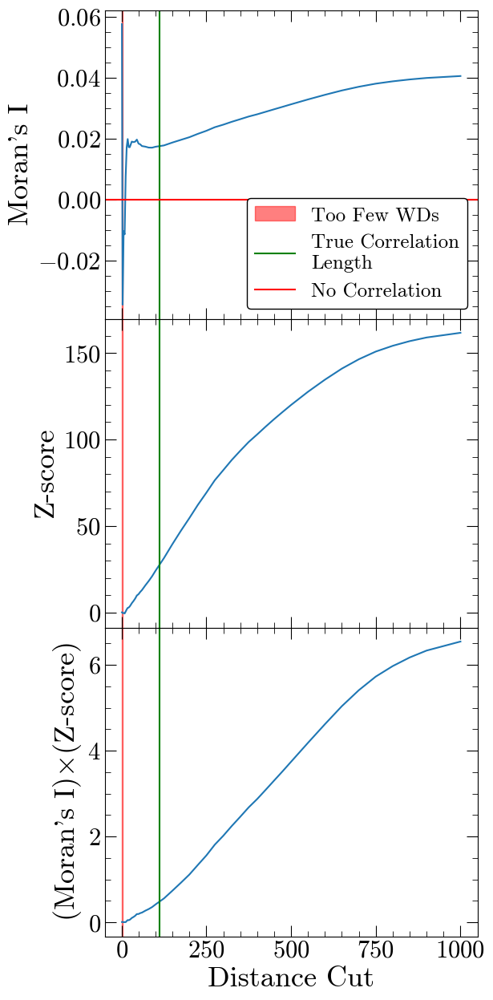

521.4 1.6e-05


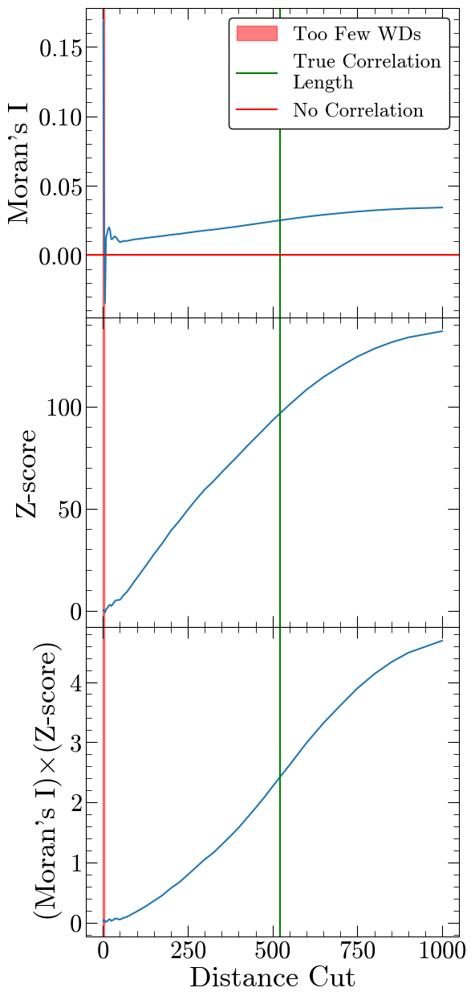

178.86 0.1


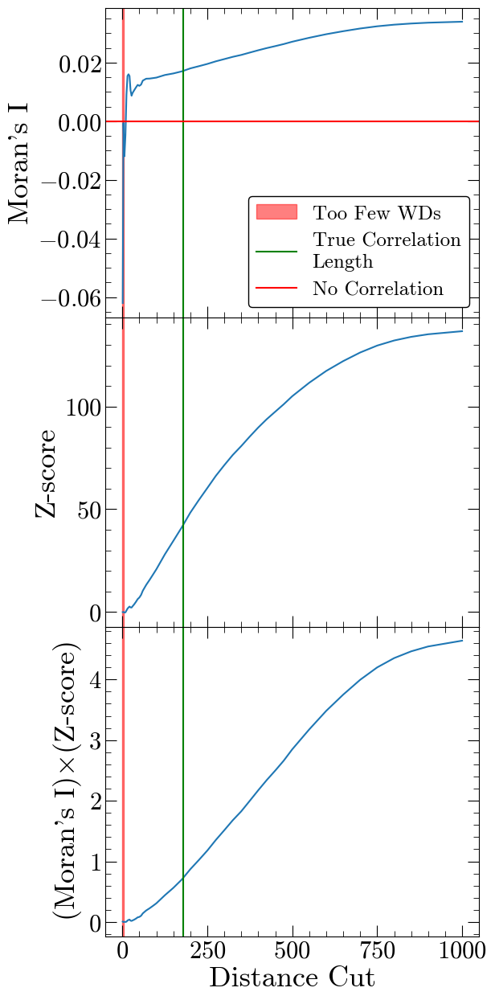

91.31 4.8e-05


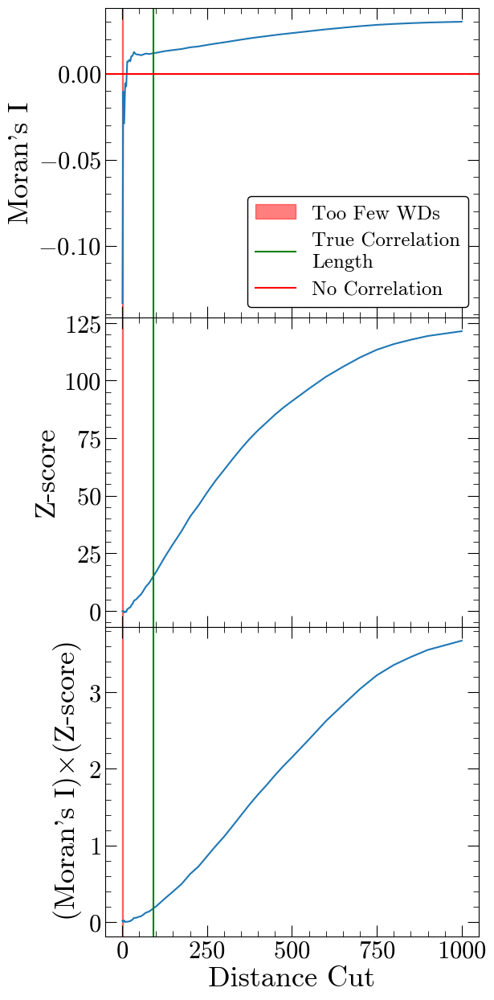

585.7 7e-08


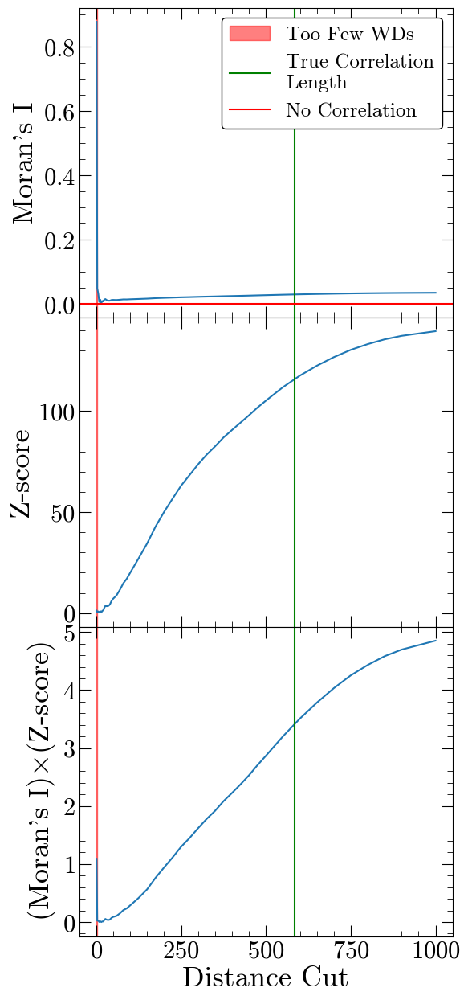

94.66 1e-10


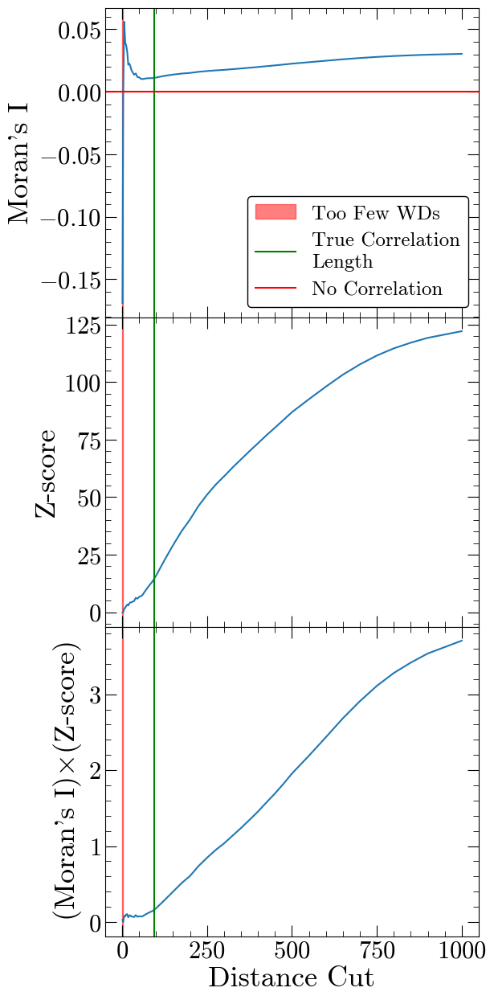

159.23 0.0038


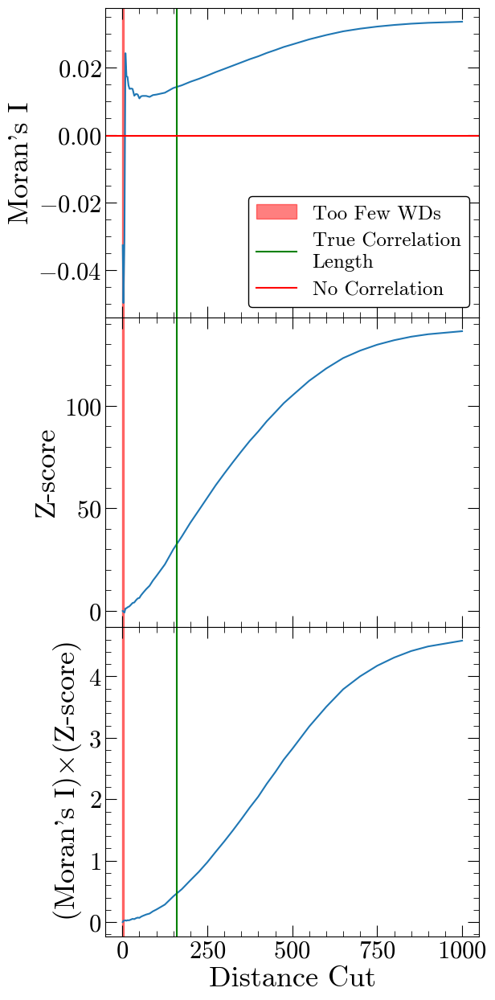

225.7 7.8e-09


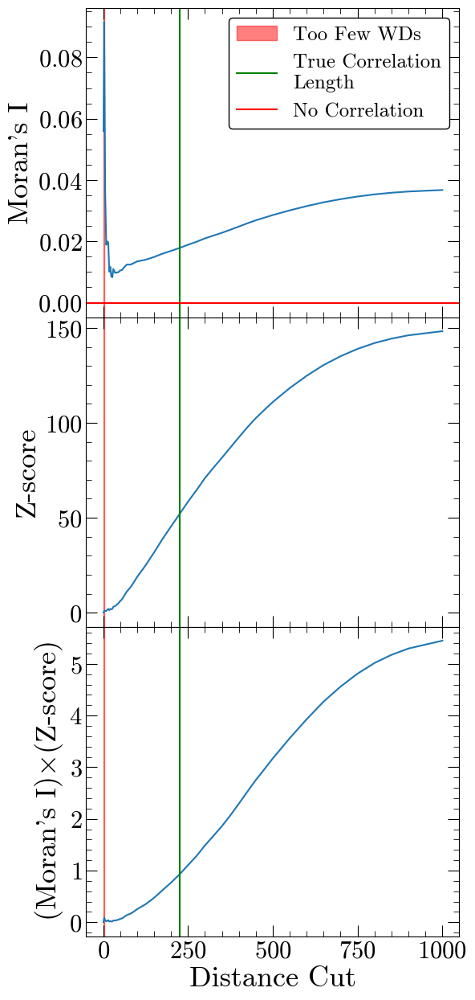

497.7 2.3e-08


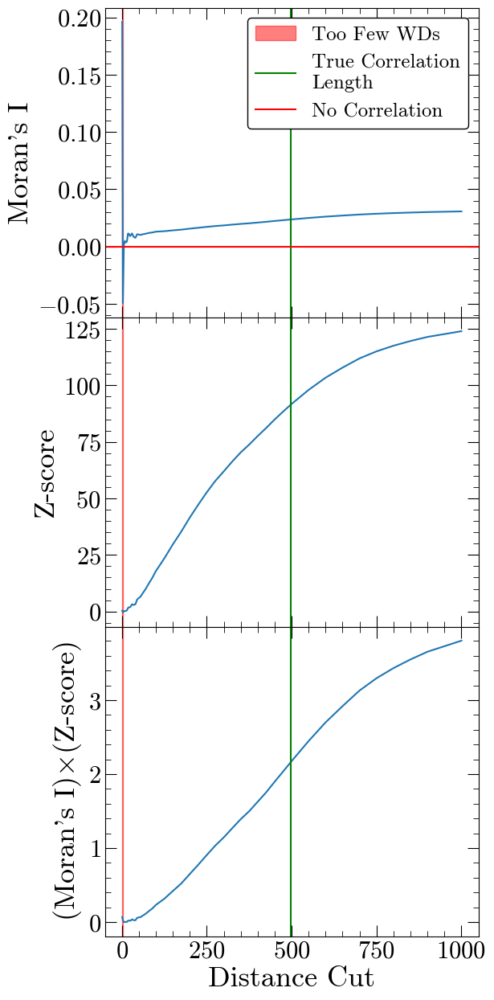

91.31 5.5e-06


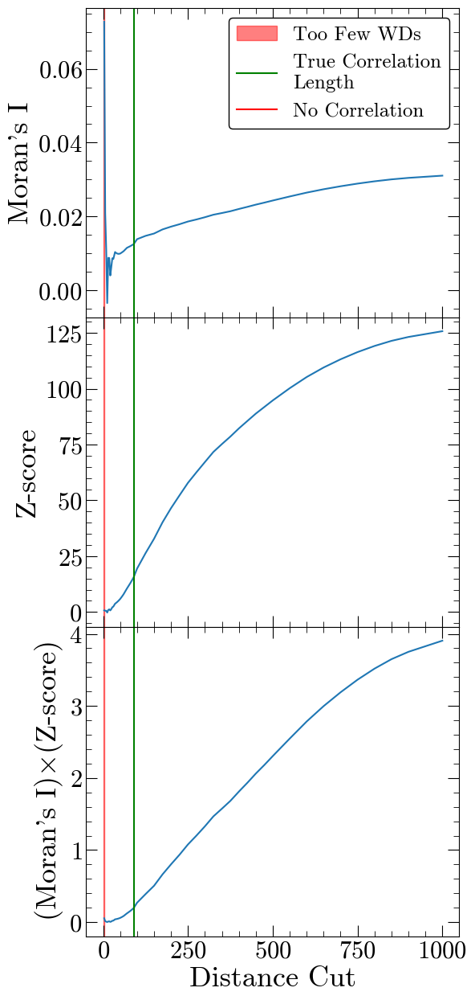

In [6]:
#display a few curves from the training data set
indices=np.random.randint(len(simulation_params_run), size=10)
for index in indices:
    corr_length=simulation_params_run[index][0]
    epsilon=simulation_params_run[index][1]
    print(corr_length,epsilon)
    sample_size=10207
    output=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

# Make a representative plot of various epsilons and correlation lengths

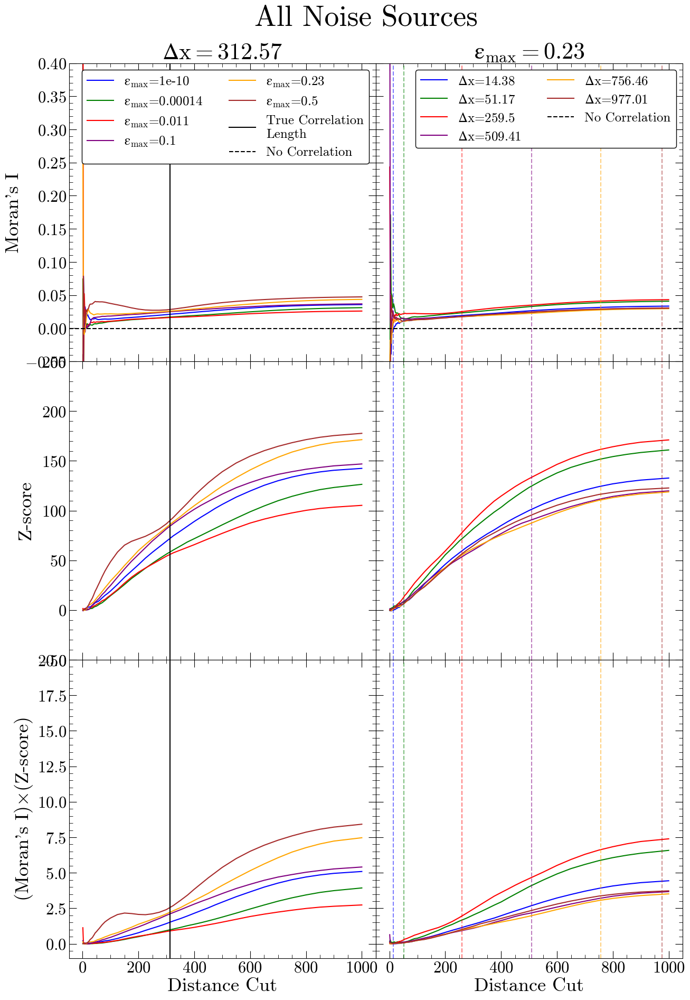

In [7]:
fig, ((ax1,ax4),(ax2,ax5),(ax3,ax6)) = plt.subplots(3,2,figsize=(15,22),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[1e-10,0.00014,0.011,0.1,0.23,0.5]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon_{max}$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='upper right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))
    
#One epsilon length, various correlation lengths
epsilon=0.23
corr_lengths_subset=[14.38, 51.17, 259.5, 509.41, 756.46, 977.01]
for i in range(len(corr_lengths_subset)):
    corr_length=corr_lengths_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax4.plot(final_distances,moransIs,color=color,label='$\Delta x$='+str(corr_length))
    ax4.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax5.plot(final_distances,zscores,color=color)
    ax5.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax6.plot(final_distances,mult,color=color)  
    ax6.axvline(corr_length,color=color,linestyle='--',alpha=0.5)

ax4.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax4.legend(ncol=2,loc='upper right')

ax6.set_xlabel('Distance Cut')

ax4.set_title('$\epsilon_{max}=$'+str(epsilon))

#clean up the plot
ax1.set_ylim(-0.05,0.4)
ax4.set_ylim(-0.05,0.4)

ax2.set_ylim(-50,250)
ax5.set_ylim(-50,250)

ax3.set_ylim(-1,20)
ax6.set_ylim(-1,20)

ax4.set_yticklabels([]) 
ax5.set_yticklabels([]) 
ax6.set_yticklabels([]) 

fig.suptitle('All Noise Sources', fontsize=40, x=0.5, y=0.93)
plt.subplots_adjust(wspace = 0,hspace=0)

plt.savefig('curves_all_noise.pdf', dpi=300)#, pad_inches=0.3)

(-0.02, 3.0)

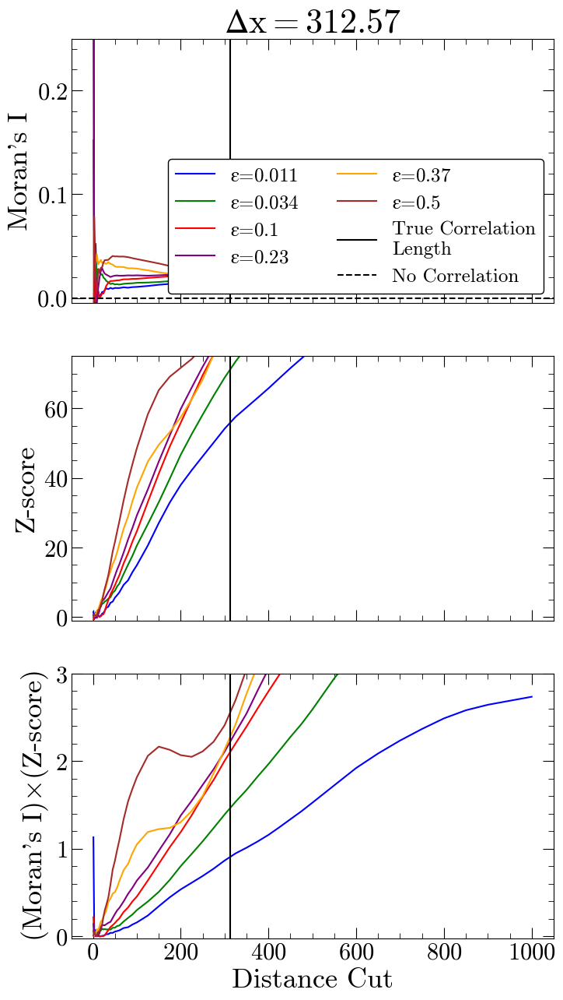

In [26]:
#find minimum visible epsilon

#min=0.37
fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(8,15),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[0.011,0.034,0.1,0.23,0.37,0.5]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='lower right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))

#clean up the plot
ax1.set_ylim(-0.005,0.25)

ax2.set_ylim(-1,75)

ax3.set_ylim(-.02,3)
 

# Set up the training and testing data for the CNN

In [9]:
sample_size=10207

x_train=[]
y_train=[]
ep_train=[]
for simulation in simulation_params_run:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_train.append(normalized)
    #save correlation length as true label
    y_train.append(corr_length)
    #also save epsilon
    ep_train.append(epsilon)
    
x_train=np.array(x_train)
y_train=np.array(y_train)
ep_train=np.array(ep_train)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_train=np.nan_to_num(x_train)

#check for NaNs and Infs
print(np.isnan(x_train).any())
print(np.isinf(x_train).any())

training_data=pd.DataFrame()
training_data['y_true']=y_train
training_data['epsilon']=ep_train

training_data.head()

False
False


,y_true,epsilon
0,4.34,1.000000e-10
1,4.34,3.000000e-10
2,4.34,8.900000e-10
3,4.34,2.600000e-09
4,4.34,7.800000e-09


In [10]:
x_test=[]
y_test=[]
ep_test=[]
for simulation in simulation_params_run_testing:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'testing',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_test.append(normalized)
    #save correlation length as true label
    y_test.append(corr_length)
    #also save epsilon
    ep_test.append(epsilon)
    
x_test=np.array(x_test)
y_test=np.array(y_test)
ep_test=np.array(ep_test)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_test=np.nan_to_num(x_test)

#check for NaNs and Infs
print(np.isnan(x_test).any())
print(np.isinf(x_test).any())

testing_data=pd.DataFrame()
testing_data['y_true']=y_test
testing_data['epsilon']=ep_test

testing_data.head()

False
False


,y_true,epsilon
0,10,1.000000e-10
1,10,1.000000e-07
2,10,1.000000e-04
3,10,1.000000e-03
4,10,5.000000e-03


### Train and Test different CNN configurations

In [29]:
def comparison_stats(data,verbose,success_fit=False,success_fit_threshold=0.1):
    if success_fit:
        init_len=len(data)
        data['abs_frac_err']=np.abs((data['y_true']-data['y_pred'])/data['y_true'])
        data=data.query('abs_frac_err<@success_fit_threshold')
        num_success=len(data)
        #reset the indices
        indices=np.arange(0,len(data))
        data.set_index(indices,inplace=True)
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=num_success/init_len
    else:
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=None
    
    error=y_true-y_pred
    frac_err=error/y_true
    
    #calculate the rmse
    rmse = 0
    for i in range(len(y_true)):
        rmse += (error[i])**2
    rmse = np.sqrt(rmse / len(y_true))
    
    #calculate the median absolute error between the datasets
    mae=np.median(np.abs(error))

    #calculate the bias between the datasets
    bias=np.median(error)
    
    #calculate the median absolute fractional error
    med_frac=np.median(np.abs(frac_err))
    
    if verbose:
        if success_fit:
            print(r'Frac Success Fit: {:2.3f} '.format(frac_success))
        print(r'RMSE: {:2.3f} '.format(rmse)+'pc')
        print(r'MAE: {:2.3f} '.format(mae)+'pc')
        print(r'BIAS: {:2.3f} '.format(bias)+'pc')
        print(r'MED FRAC ERR: {:2.3f} '.format(med_frac))
        
    return(rmse,mae,bias,med_frac,error,frac_err,frac_success)

In [30]:
def comparison_plots(training_data,testing_data,success_fit_threshold=0.1,statx=10,staty=700,statdy=50,lim='default', siegel=True,verbose=True):
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    if verbose:
        print('Training Stats')
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,verbose)
    if verbose:
        print('')
        print('Training Stats, Successful Fits')
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,verbose,True,success_fit_threshold)
    if verbose:
        print('')
        print('Testing Stats')
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,verbose)
    if verbose:
        print('')
        print('Testing Stats, Successful Fits')
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,verbose,True,success_fit_threshold)
    
    stats_df=pd.DataFrame()
    stats_df['mae_training']=[mae_training]
    stats_df['frac_success_training']=[frac_success_training]
    stats_df['mae_testing']=[mae_testing]
    stats_df['frac_success_testing']=[frac_success_testing]
    
    #plot the agreement with stats
    fig, (ax1,ax2) =plt.subplots(1,2,figsize=(16,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
        
    ax2.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax2.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax2.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax2.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax2.legend()
    if lim!='default':
        ax2.set_xlim((lim[0],lim[1]))
        ax2.set_ylim((lim[0],lim[1]))
    ax2.set_yscale('log')
    ax2.set_xscale('log')
    plt.show()
    
    #plot the agreement with trendlines
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    #add a linear trendlines
    if siegel==True:
        coef = stats.siegelslopes(y_pred_testing, y_true_testing)
        poly1d_fn = np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    else:
        coef= np.polyfit(y_true_testing,y_pred_testing,1)
        poly1d_fn= np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    plt.show()

    # plot the fractional error between the datasets
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.legend()
    plt.show()
    
    # plot the fractional error between the datasets
    # again but zoomed in
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.set_ylim((-1,1))
    ax1.legend()
    plt.show()
    
    return(stats_df)
    

In [31]:
#define a function to create the heatmap
def heatmap(data, row_labels, col_labels, ax=None):
    if not ax:
        ax = plt.gca()
        
    # Define color map with custom gradients
    cmap = plt.cm.viridis  # Default, replace with any colormap of your choice
    # Define boundaries for the color ranges
    boundaries = [0, 2, 4, 6, 8, 10, 1000]
    # Define colors corresponding to each range (make sure this matches the number of ranges)
    colors_for_ranges = [
    '#228B22',  # Forest Green
    '#32CD32',  # Lime Green
    '#FFD700',  # Gold (Yellow)
    '#FFA500',  # Orange
    '#FF4500',  # Orange Red
    '#DC143C',  # Crimson
    'black']
    # Create a ListedColormap and BoundaryNorm
    cmap = pltcolors.ListedColormap(colors_for_ranges)
    norm = pltcolors.BoundaryNorm(boundaries, cmap.N)
    
    # Plot the heatmap
    im = ax.imshow(data, cmap=cmap, norm=norm)
    
    #label rows/columns
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_xticklabels(col_labels)#, fontsize=10)
    ax.set_yticks(np.arange(data.shape[0]))
    ax.set_yticklabels(row_labels)
    
    #draw grid lines
    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="k", linestyle='-', linewidth=0.5,alpha=0.3)
    ax.tick_params(which="minor", bottom=False, left=False,top=False, right=False)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    return im

def heatmap_testing_data(testing_data,figtitle=None,savefig=False,figname=None):
    data=[]
    failed_fit_region_count=0
    for corr_len in corr_lengths_testing:
        tmp=[]
        for epsilon in epsilons_testing:
            val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
            tmp.append(val)
            if val>10:
                failed_fit_region_count+=1
        data.append(tmp)
    data=np.array(data)
    
    fig,ax0=plt.subplots(1, 1, figsize=(10, 10))
    ylabels=[str(i) for i in corr_lengths_testing]
    xlabels=[str(i) for i in epsilons_testing]
    hm=heatmap(data, ylabels, xlabels, ax=ax0)
    ax0.set_xlabel('$\epsilon$')
    ax0.set_ylabel('$\Delta x_{true}$')
    
    ax0.set_title(figtitle)
    
    #plot colorbar
    cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])
    fig.colorbar(hm, cbar_ax)
    cbar_ax.set_ylabel("Absolute Percent Error")#,fontsize=16)
    
    if savefig:
        plt.savefig(figname+'.pdf', dpi=300)
        
    plt.show()
    print('Number of squares with abs percent err>10%, ', failed_fit_region_count)
    
    return(failed_fit_region_count)

In [45]:
def test_model(model,stats=True,plot=True):
    sample_size=10207
    
    # use the model to predict the training data
    y_pred_train = model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the testing data
    y_pred_test = model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold=0.1)
    
    if plot:
        #some runs return NaNs, show those fits
        nan_corr_lengths=testing_data[testing_data['y_pred'].isna()]
        print('')
        print('Showing the '+str(len(nan_corr_lengths))+' curves that returned NaNs')
        display(nan_corr_lengths)
        for i in range(len(nan_corr_lengths)):
            corr_length=nan_corr_lengths['y_true'].to_list()[i]
            epsilon=nan_corr_lengths['epsilon'].to_list()[i]
            output=get_output(corr_length,epsilon,sample_size,'testing',plot=True)

        #show comparison stats and plots
        stats_df=comparison_plots(training_data,testing_data)
        
        #show testing data absolute percent error heatmap
        failed_fit_region_count=heatmap_testing_data(testing_data) 
    else:
        stats_df=None
        nan_corr_lengths='Not saved!'
        failed_fit_region_count=0
        for corr_len in corr_lengths_testing:
            for epsilon in epsilons_testing:
                val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
                if val>10:
                    failed_fit_region_count+=1
    
    if stats:
        return(stats_df)
    else:
        return(failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths)

# Pick models and tune the model hyperparameters

1. **Number of Filters in Convolutional Layers**
   The number of filters (also known as the number of output channels) determines the depth of the feature maps after each convolutional layer.
   **What to try:**
   - You can experiment with **increasing** the number of filters in each layer.
   - Alternatively, **decrease** the number of filters to make the model simpler and see if performance improves.
   
   Keep in mind that increasing the number of filters typically increases the model’s capacity, which can improve performance on more complex tasks but may also lead to overfitting if not properly regularized.

2. **Kernel Size**
   The kernel size defines the window of the convolution. 
   **What to try:**
   - **Larger kernel sizes** (e.g., 5 or 7) might capture broader patterns, which can be useful if the input data has long-range dependencies.
   - **Smaller kernel sizes** (e.g., 1 or 2) might be beneficial if you want to capture very fine-grained features.

3. **Number of Layers**
   The depth of the network can have a significant impact on its performance.
   **What to try:**
   - Adding more **convolutional layers** (e.g., 4 or 5 layers instead of 3) could help the model learn more complex patterns.
   - Alternatively, you can **reduce the number of layers** and see if performance improves, especially if overfitting is a concern.

4. **Pooling Layers**
   Pooling layers help reduce spatial dimensions and retain important features. You're using `MaxPooling1D(2)` after each convolution layer, which is a good starting point.
   **What to try:**
   - **Change the pooling size** (e.g., use `MaxPooling1D(3)` or `MaxPooling1D(4)`).
   - Experiment with different **types of pooling** (e.g., **AveragePooling1D**) to see if it affects performance.

5. **Dense Layer Units**
   In your current model, the final dense layer has 128 units with ReLU activation. The number of units in this layer controls the representational capacity of the fully connected portion of the network.
   **What to try:**
   - You can experiment with **increasing** or **decreasing** the number of units (e.g., try 64 or 256 units).
   - You can also **add another dense layer** between the existing dense layer and the output to increase the model's capacity.

6. **Optimizer and Learning Rate**
   You're using the **Adam optimizer** with its default settings, which is a good default choice for most tasks. However, adjusting the learning rate can have a significant impact on performance.
   **What to try:**
   - **Adjust the learning rate** (e.g., `learning_rate=0.001`, `learning_rate=0.0005`, `learning_rate=0.0001`).
   - You could also experiment with **different optimizers** (e.g., **SGD**, **RMSprop**) to see if they improve convergence speed or final accuracy.

7. **Batch Size**
   The batch size you’re currently using is 32, which is a standard choice.
   **What to try:**
   - Experiment with **larger batch sizes** (e.g., 64 or 128) to speed up training, or **smaller batch sizes** (e.g., 16 or 8) if you believe that could help the model generalize better.
   - Smaller batch sizes can help avoid local minima, while larger batch sizes usually converge faster.

8. **Regularization (Dropout or L2 Regularization)**
   You’re not using any regularization at the moment, which may cause overfitting, especially with a deep model.
   **What to try:**
   - **Dropout**: Add `Dropout` layers after the convolutional or dense layers to help prevent overfitting. Try dropout rates between 0.2 and 0.5.
   - **L2 Regularization**: Add L2 regularization to your layers, which helps penalize large weights and reduces overfitting. Example: `kernel_regularizer=l2(0.01)`.

9. **Activation Function**
   You're using ReLU as the activation function for all layers, which is quite common.
   **What to try:**
   - Experiment with different **activation functions** for the hidden layers, such as **LeakyReLU**, **ELU**, or **SELU**.
   - For the output layer, if you're predicting a continuous variable (since you're using `mse` loss), you may want to use a **linear activation** (which is the default for `Dense(1)`).


Epoch 1/100
92/92 [==============================] - 1s 6ms/step - loss: 129297.6719
Epoch 2/100
92/92 [==============================] - 1s 5ms/step - loss: 68087.8359
Epoch 3/100
92/92 [==============================] - 1s 6ms/step - loss: 67858.4297
Epoch 4/100
92/92 [==============================] - 1s 7ms/step - loss: 68010.7891
Epoch 5/100
92/92 [==============================] - 1s 6ms/step - loss: 67960.6172
Epoch 6/100
92/92 [==============================] - 1s 7ms/step - loss: 67819.2656
Epoch 7/100
92/92 [==============================] - 1s 6ms/step - loss: 67741.5938
Epoch 8/100
92/92 [==============================] - 1s 6ms/step - loss: 67529.3281
Epoch 9/100
92/92 [==============================] - 1s 6ms/step - loss: 67959.9844
Epoch 10/100
92/92 [==============================] - 1s 6ms/step - loss: 67739.0547
Epoch 11/100
92/92 [==============================] - 1s 6ms/step - loss: 67677.3984
Epoch 12/100
92/92 [==============================] - 1s 7ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 256.941 pc
MAE: 204.957 pc
BIAS: -86.615 pc
MED FRAC ERR: 0.607 

Training Stats, Successful Fits
Frac Success Fit: 0.074 
RMSE: 18.451 pc
MAE: 13.357 pc
BIAS: 2.214 pc
MED FRAC ERR: 0.044 

Testing Stats
RMSE: 315.935 pc
MAE: 251.409 pc
BIAS: -17.183 pc
MED FRAC ERR: 0.613 

Testing Stats, Successful Fits
Frac Success Fit: 0.059 
RMSE: 20.990 pc
MAE: 18.993 pc
BIAS: -13.572 pc
MED FRAC ERR: 0.082 


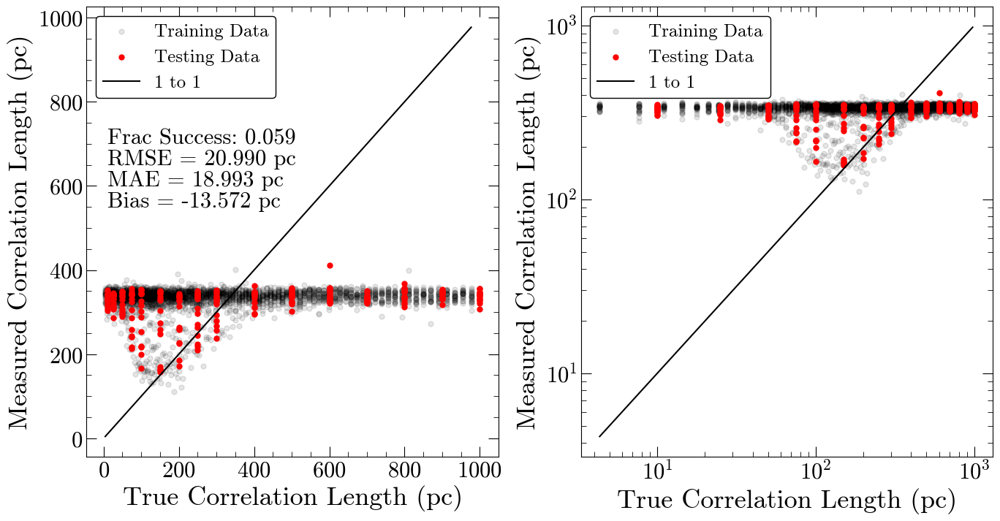

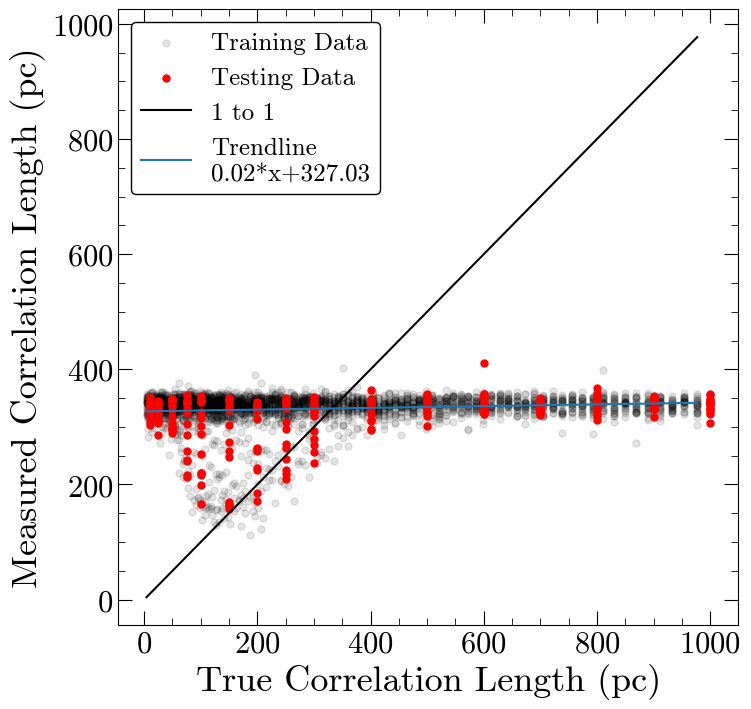

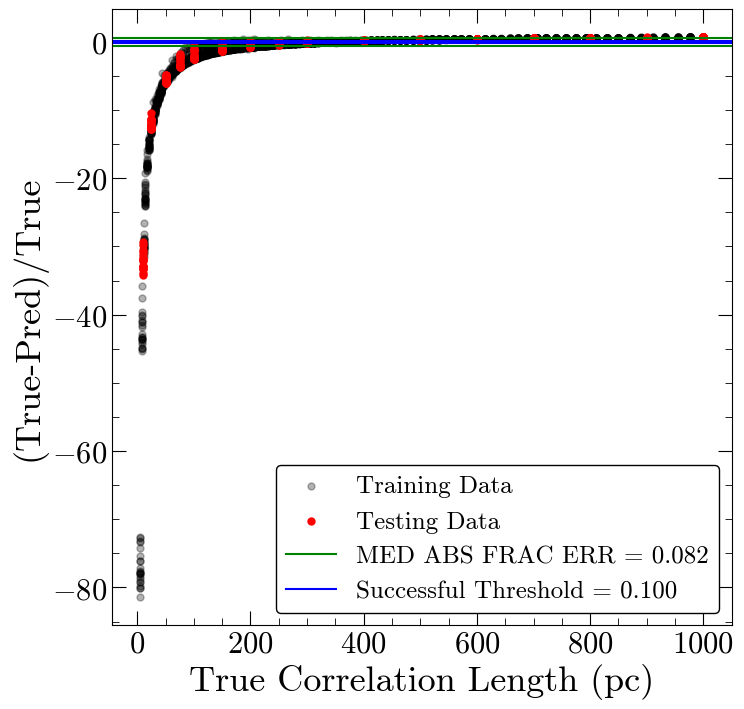

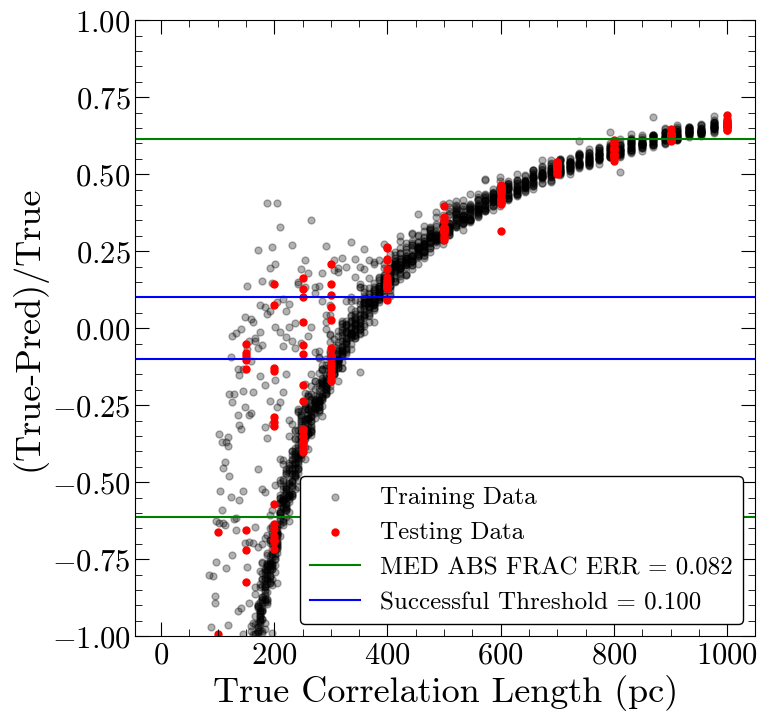

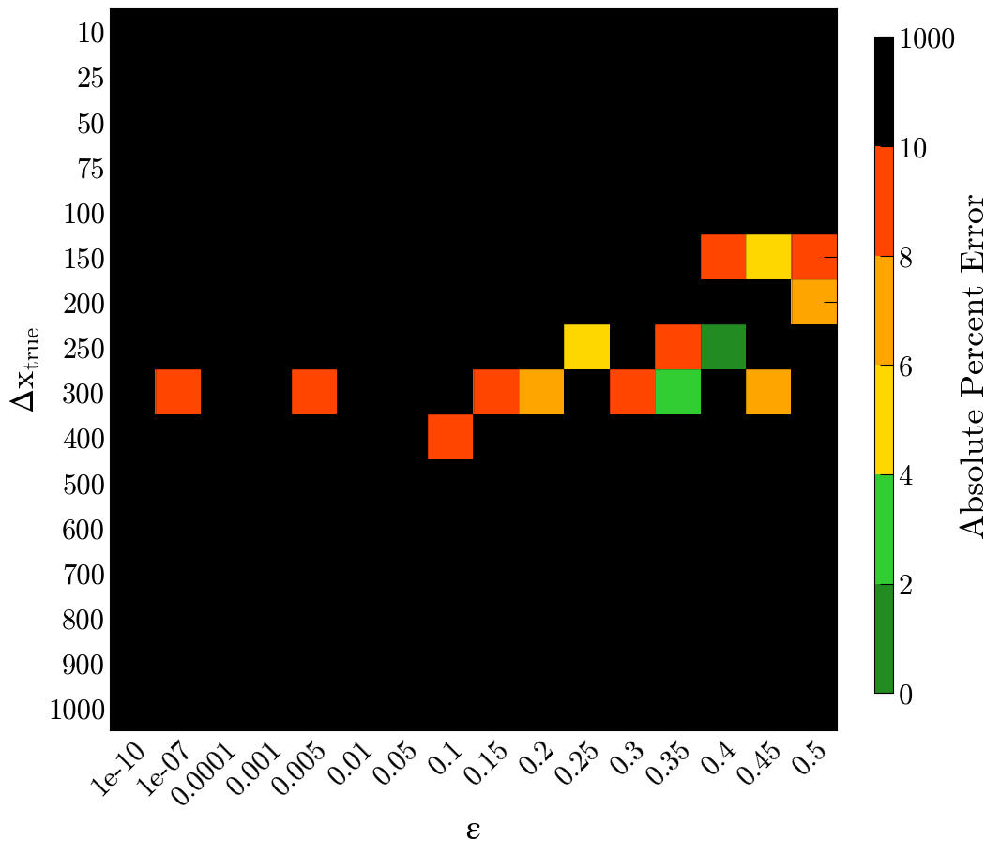

Number of squares with abs percent err>10%,  241


In [33]:
#simple model
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats for all models to compare and find best model
all_model_stats=output

Epoch 1/200
92/92 [==============================] - 1s 7ms/step - loss: 126742.8281
Epoch 2/200
92/92 [==============================] - 1s 8ms/step - loss: 68191.9219
Epoch 3/200
92/92 [==============================] - 1s 10ms/step - loss: 67981.6484
Epoch 4/200
92/92 [==============================] - 1s 6ms/step - loss: 68256.4531
Epoch 5/200
92/92 [==============================] - 1s 7ms/step - loss: 67942.0938
Epoch 6/200
92/92 [==============================] - 1s 7ms/step - loss: 67847.4766
Epoch 7/200
92/92 [==============================] - 1s 6ms/step - loss: 67826.0391
Epoch 8/200
92/92 [==============================] - 1s 7ms/step - loss: 67840.5703
Epoch 9/200
92/92 [==============================] - 1s 9ms/step - loss: 67683.5625
Epoch 10/200
92/92 [==============================] - 1s 9ms/step - loss: 67564.7500
Epoch 11/200
92/92 [==============================] - 1s 8ms/step - loss: 67878.2578
Epoch 12/200
92/92 [==============================] - 1s 9ms/step - loss

92/92 [==============================] - 1s 7ms/step - loss: 65275.9141
Epoch 193/200
92/92 [==============================] - 1s 9ms/step - loss: 65362.0938
Epoch 194/200
92/92 [==============================] - 1s 8ms/step - loss: 65328.2852
Epoch 195/200
92/92 [==============================] - 1s 8ms/step - loss: 65255.1758
Epoch 196/200
92/92 [==============================] - 1s 8ms/step - loss: 65292.3867
Epoch 197/200
92/92 [==============================] - 1s 9ms/step - loss: 65345.1602
Epoch 198/200
92/92 [==============================] - 1s 7ms/step - loss: 65250.8555
Epoch 199/200
92/92 [==============================] - 1s 9ms/step - loss: 65489.0742
Epoch 200/200
92/92 [==============================] - 1s 9ms/step - loss: 65275.7656

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 255.232 pc
MAE: 194.112 pc
BIAS: -71.400 pc
MED FRAC ERR: 0.599 

Training Stats, Successful Fits
Frac Success Fit: 0.073 
RMSE: 17.857 pc
MAE: 12.472 pc
BIAS: 0.828 pc
MED FRAC ERR: 0.045 

Testing Stats
RMSE: 315.672 pc
MAE: 245.867 pc
BIAS: 4.287 pc
MED FRAC ERR: 0.602 

Testing Stats, Successful Fits
Frac Success Fit: 0.051 
RMSE: 17.258 pc
MAE: 17.551 pc
BIAS: 3.745 pc
MED FRAC ERR: 0.059 


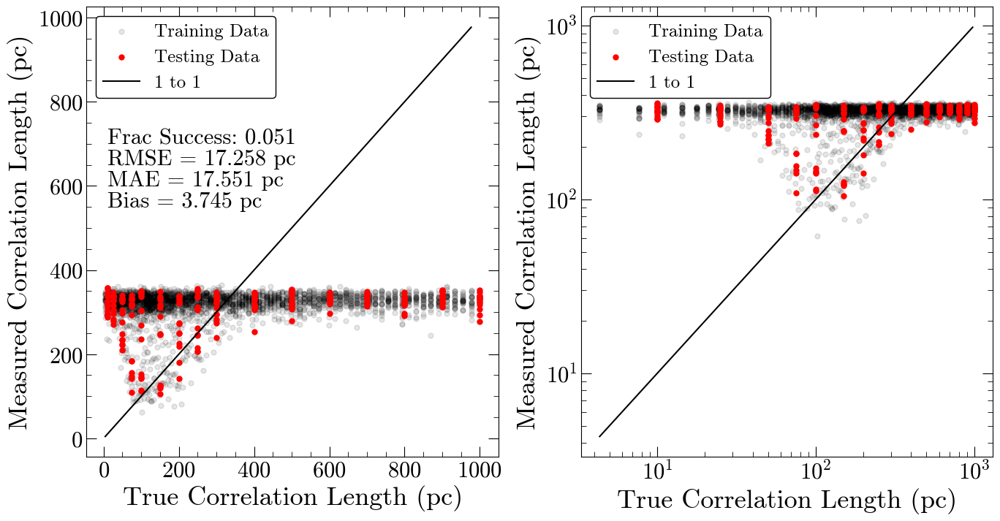

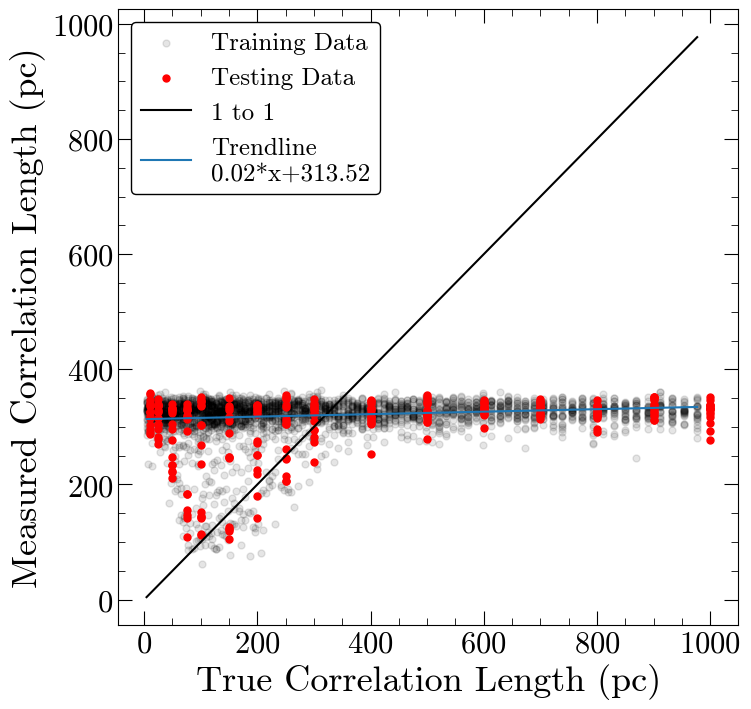

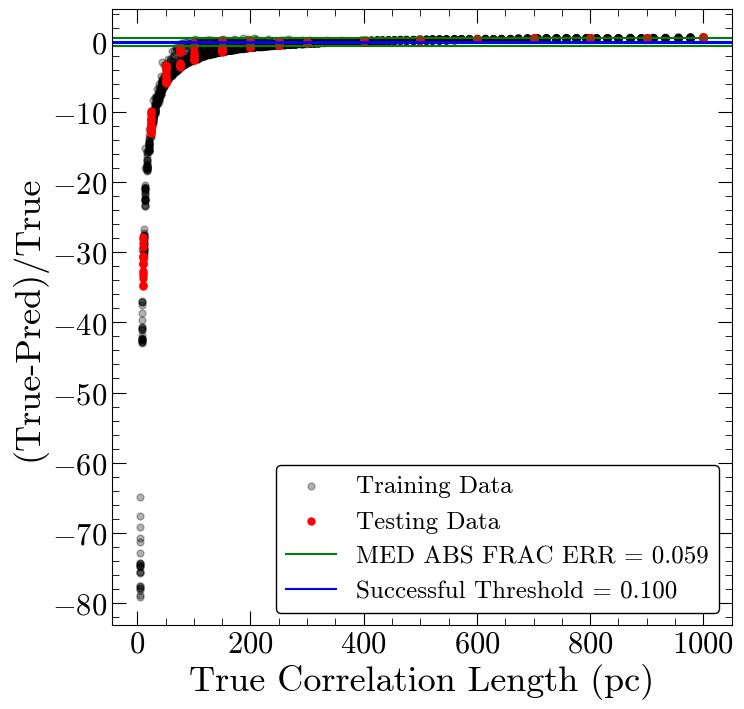

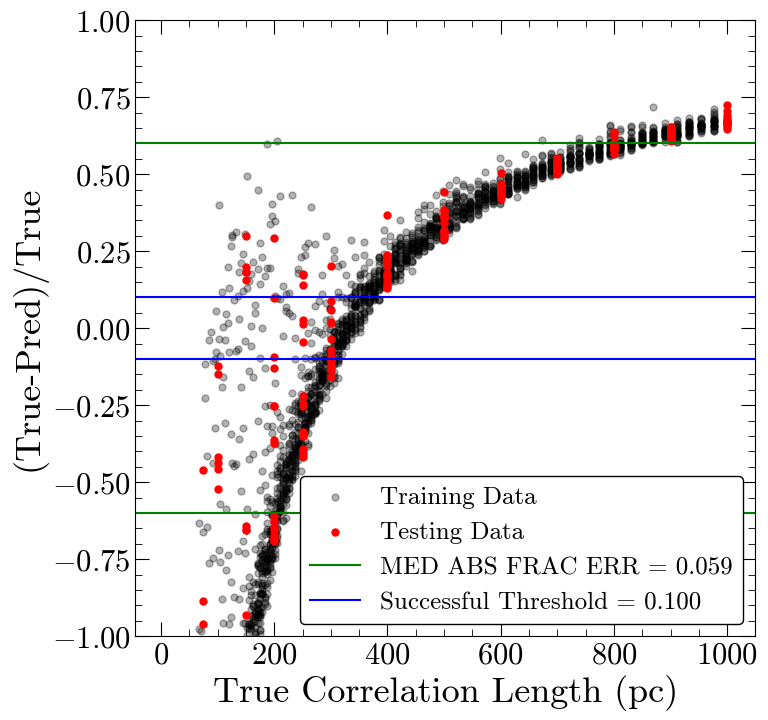

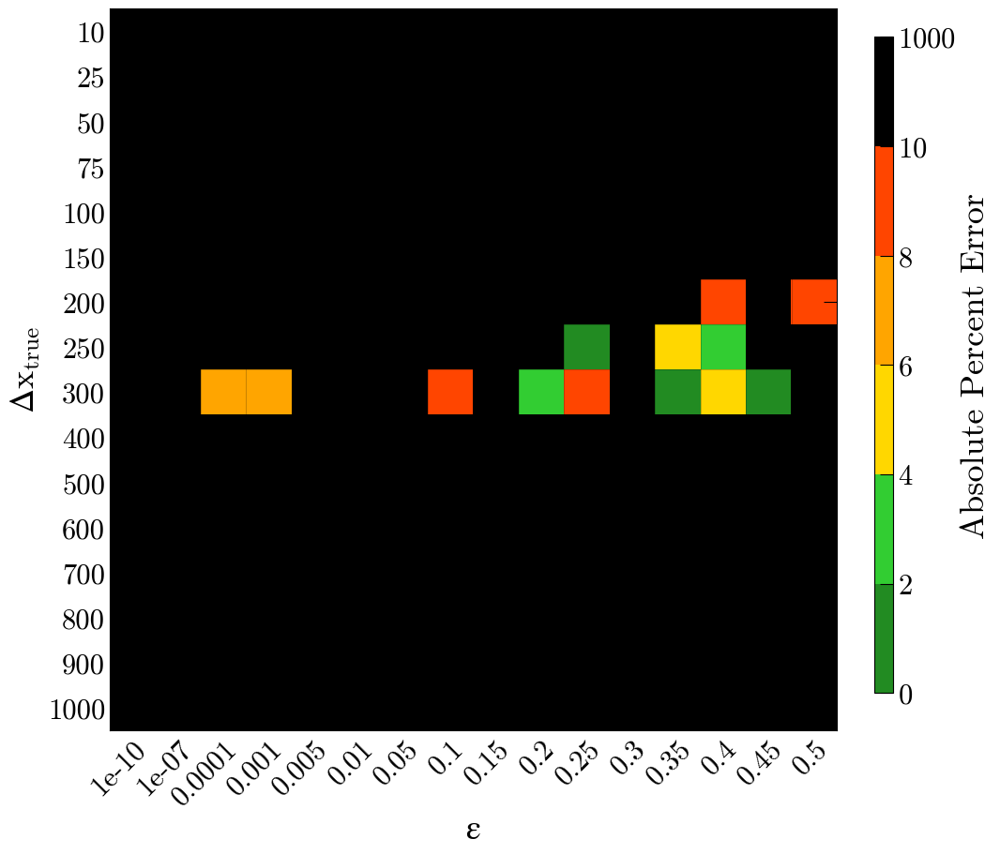

Number of squares with abs percent err>10%,  243


In [34]:
#simple model, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 2s 10ms/step - loss: 105671.7422
Epoch 2/100
92/92 [==============================] - 1s 10ms/step - loss: 68181.2422
Epoch 3/100
92/92 [==============================] - 1s 9ms/step - loss: 68015.4688
Epoch 4/100
92/92 [==============================] - 1s 9ms/step - loss: 68120.6953
Epoch 5/100
92/92 [==============================] - 1s 11ms/step - loss: 68174.8281
Epoch 6/100
92/92 [==============================] - 1s 9ms/step - loss: 67938.6641
Epoch 7/100
92/92 [==============================] - 1s 8ms/step - loss: 68145.9375
Epoch 8/100
92/92 [==============================] - 1s 9ms/step - loss: 67842.2109
Epoch 9/100
92/92 [==============================] - 1s 10ms/step - loss: 67934.2422
Epoch 10/100
92/92 [==============================] - 1s 8ms/step - loss: 67812.8281
Epoch 11/100
92/92 [==============================] - 1s 8ms/step - loss: 67913.1172
Epoch 12/100
92/92 [==============================] - 1s 8ms/step - l

92/92 [==============================] - 1s 9ms/step - loss: 66078.5391
Epoch 98/100
92/92 [==============================] - 1s 9ms/step - loss: 65680.8516
Epoch 99/100
92/92 [==============================] - 1s 9ms/step - loss: 65249.5117
Epoch 100/100
92/92 [==============================] - 1s 10ms/step - loss: 65473.9727

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 255.153 pc
MAE: 192.780 pc
BIAS: -68.504 pc
MED FRAC ERR: 0.599 

Training Stats, Successful Fits
Frac Success Fit: 0.073 
RMSE: 17.966 pc
MAE: 13.145 pc
BIAS: 0.608 pc
MED FRAC ERR: 0.047 

Testing Stats
RMSE: 315.912 pc
MAE: 241.591 pc
BIAS: 6.301 pc
MED FRAC ERR: 0.602 

Testing Stats, Successful Fits
Frac Success Fit: 0.051 
RMSE: 18.430 pc
MAE: 18.035 pc
BIAS: 6.018 pc
MED FRAC ERR: 0.068 


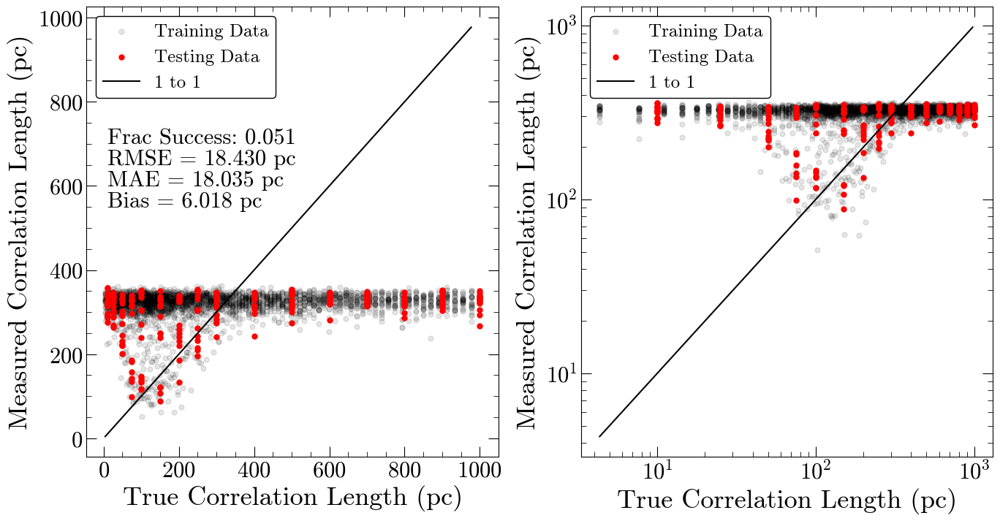

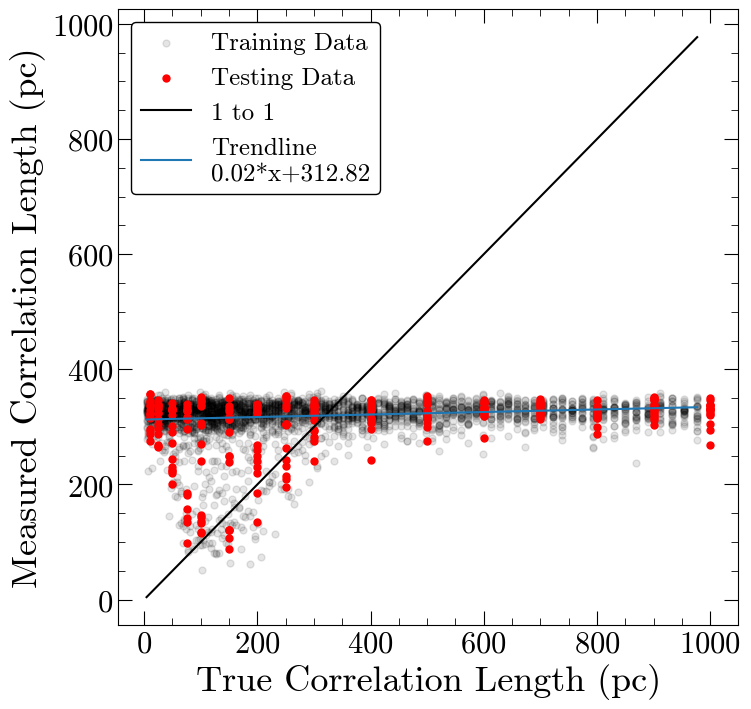

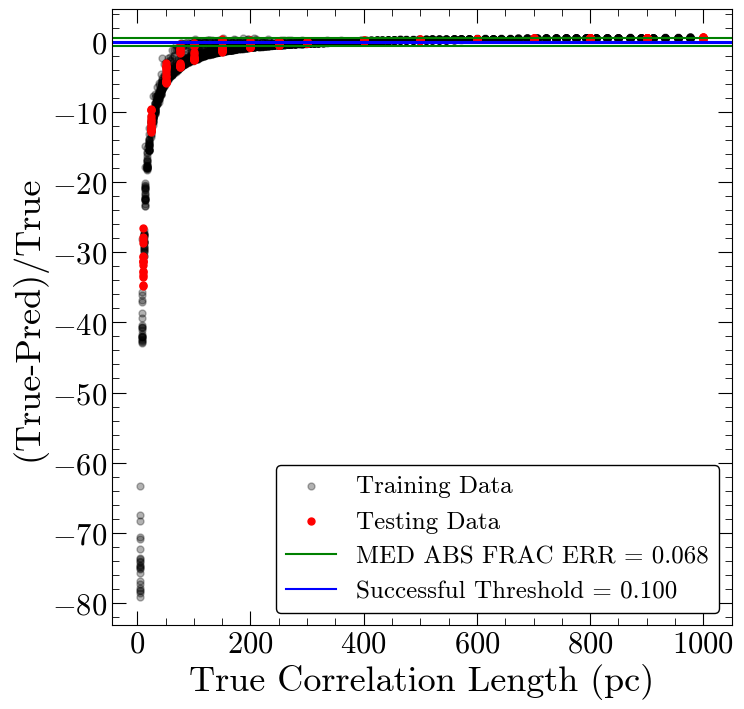

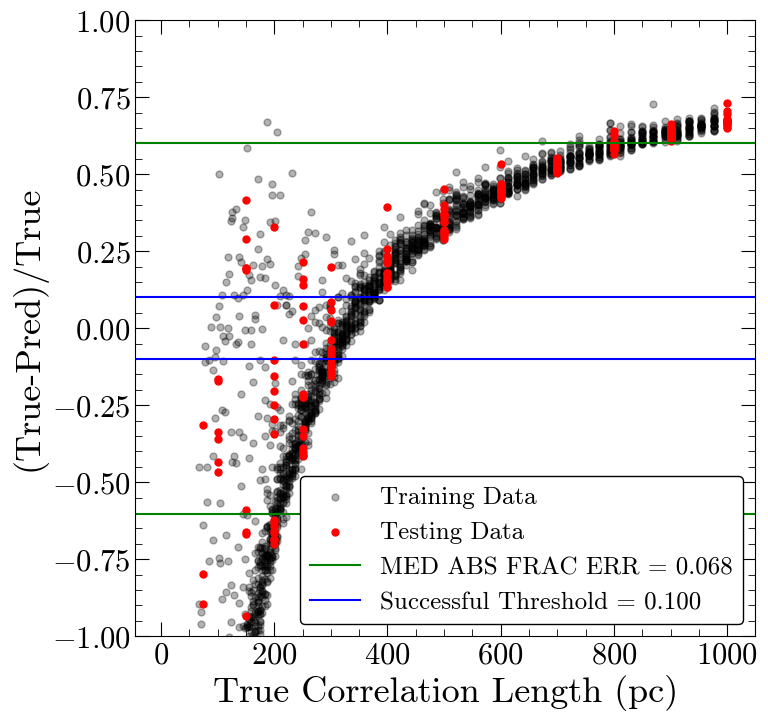

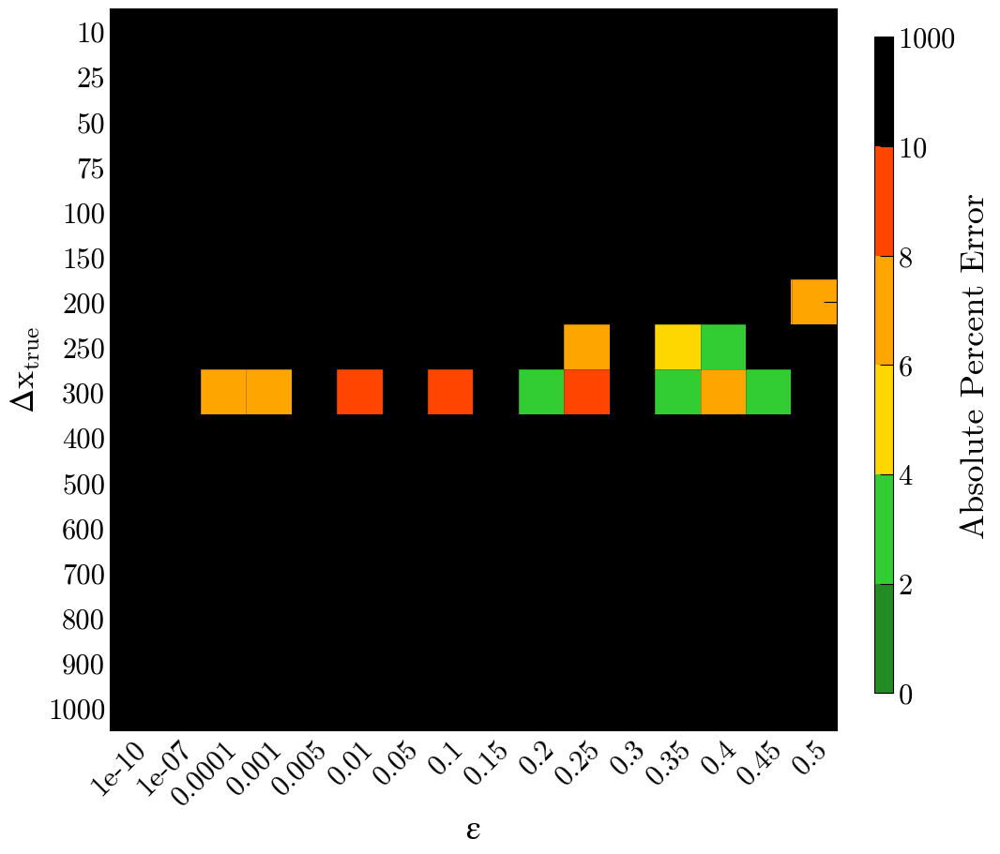

Number of squares with abs percent err>10%,  243


In [35]:
#model with more layers
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 2s 8ms/step - loss: 105007.1328
Epoch 2/200
92/92 [==============================] - 1s 12ms/step - loss: 68282.7891
Epoch 3/200
92/92 [==============================] - 1s 11ms/step - loss: 68071.6328
Epoch 4/200
92/92 [==============================] - 1s 12ms/step - loss: 68012.7812
Epoch 5/200
92/92 [==============================] - 1s 11ms/step - loss: 68439.5234
Epoch 6/200
92/92 [==============================] - 1s 11ms/step - loss: 67988.0078
Epoch 7/200
92/92 [==============================] - 1s 9ms/step - loss: 68384.4688
Epoch 8/200
92/92 [==============================] - 1s 10ms/step - loss: 68048.0938
Epoch 9/200
92/92 [==============================] - 1s 10ms/step - loss: 68246.0234
Epoch 10/200
92/92 [==============================] - 1s 10ms/step - loss: 68014.2188
Epoch 11/200
92/92 [==============================] - 1s 11ms/step - loss: 67675.3750
Epoch 12/200
92/92 [==============================] - 1s 10ms/st

92/92 [==============================] - 1s 10ms/step - loss: 65416.8281
Epoch 192/200
92/92 [==============================] - 1s 9ms/step - loss: 65118.3516
Epoch 193/200
92/92 [==============================] - 1s 8ms/step - loss: 65567.6641
Epoch 194/200
92/92 [==============================] - 1s 8ms/step - loss: 65265.1055
Epoch 195/200
92/92 [==============================] - 1s 8ms/step - loss: 65215.2148
Epoch 196/200
92/92 [==============================] - 1s 8ms/step - loss: 65360.4922
Epoch 197/200
92/92 [==============================] - 1s 8ms/step - loss: 65454.0078
Epoch 198/200
92/92 [==============================] - 1s 8ms/step - loss: 65280.1484
Epoch 199/200
92/92 [==============================] - 1s 8ms/step - loss: 65503.5391
Epoch 200/200
92/92 [==============================] - 1s 7ms/step - loss: 65482.1484

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 254.942 pc
MAE: 190.994 pc
BIAS: -67.112 pc
MED FRAC ERR: 0.600 

Training Stats, Successful Fits
Frac Success Fit: 0.076 
RMSE: 17.707 pc
MAE: 12.933 pc
BIAS: 1.111 pc
MED FRAC ERR: 0.046 

Testing Stats
RMSE: 315.916 pc
MAE: 236.889 pc
BIAS: 1.008 pc
MED FRAC ERR: 0.599 

Testing Stats, Successful Fits
Frac Success Fit: 0.055 
RMSE: 16.317 pc
MAE: 14.335 pc
BIAS: 1.008 pc
MED FRAC ERR: 0.057 


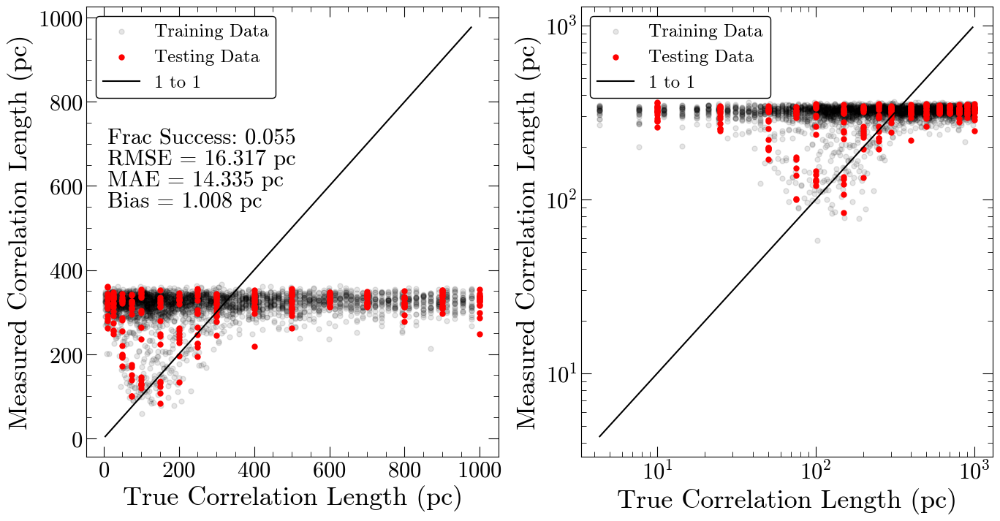

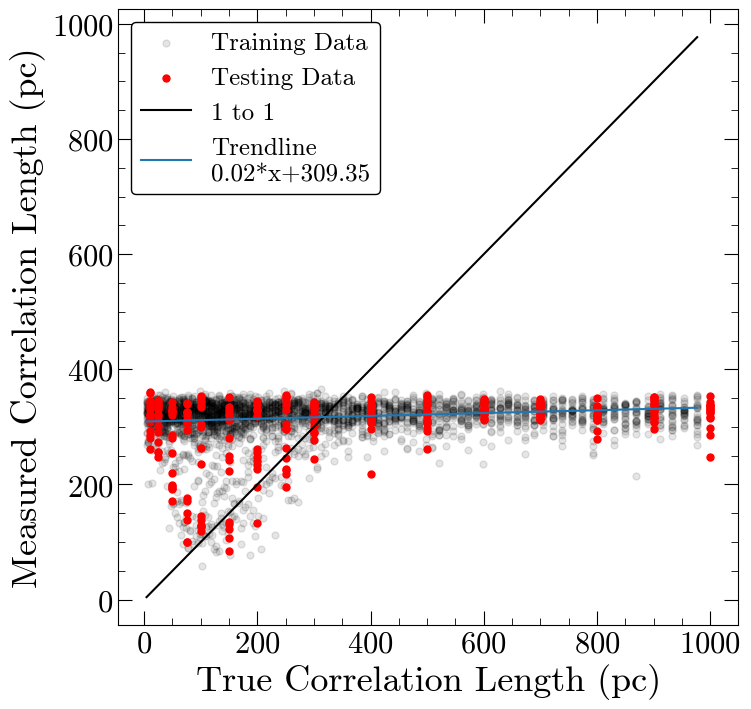

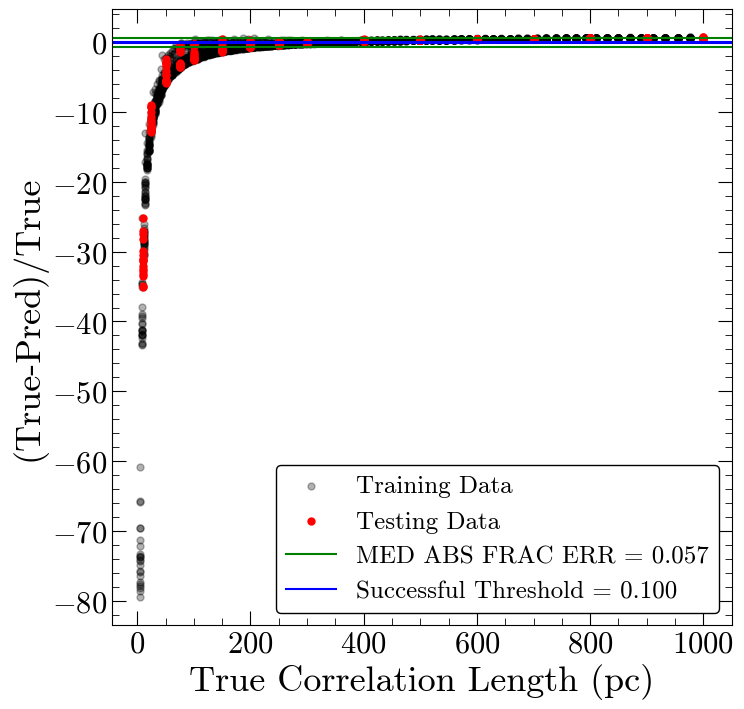

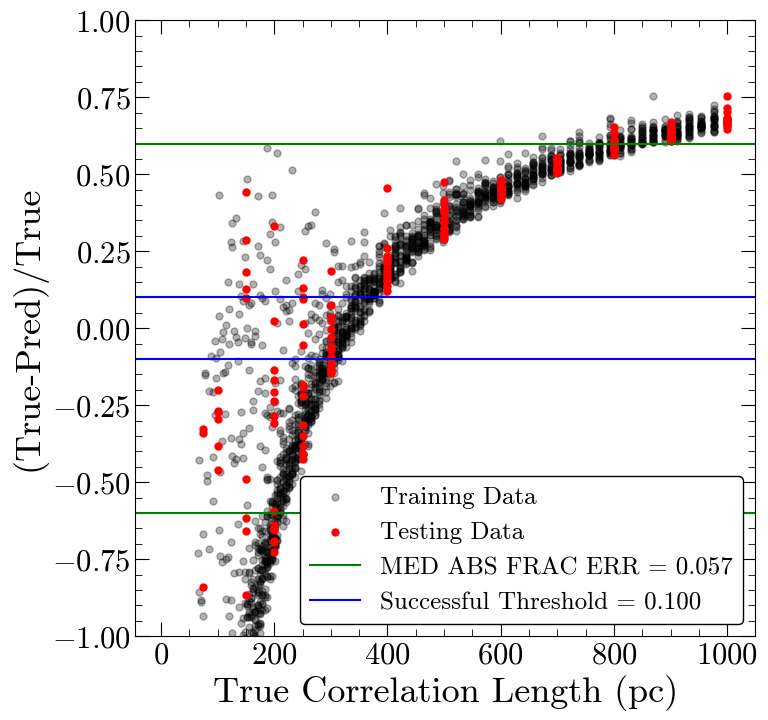

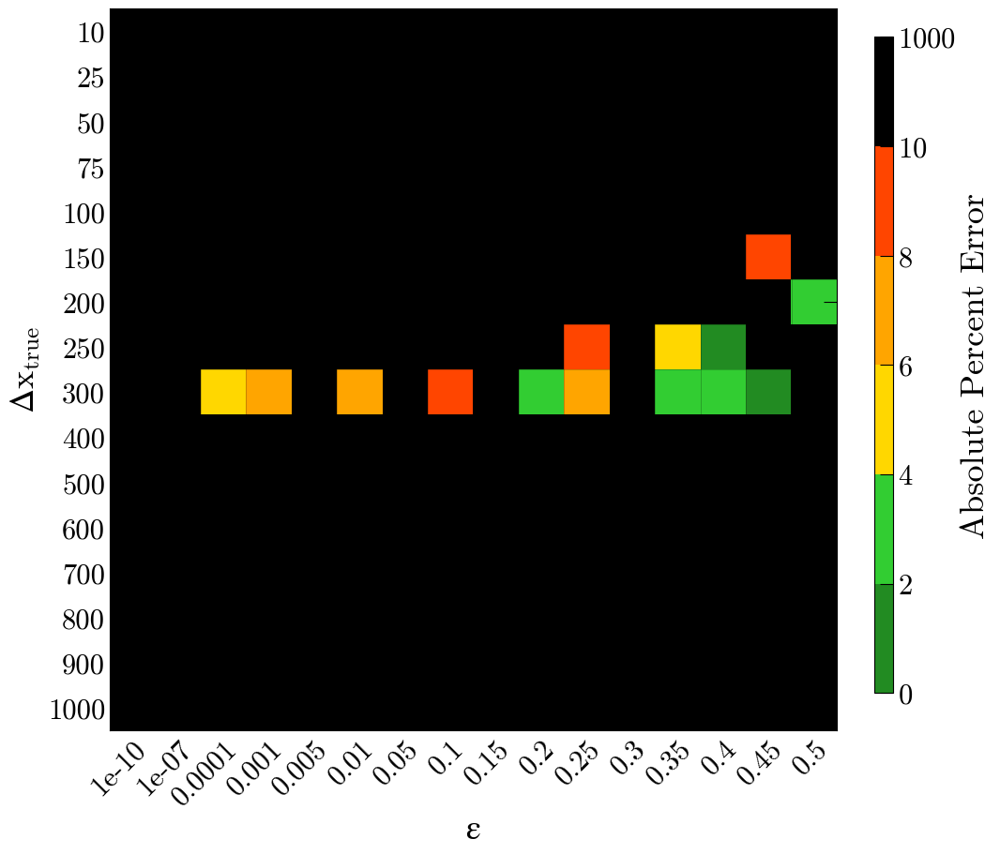

Number of squares with abs percent err>10%,  242


In [36]:
#model with more layers, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 1s 8ms/step - loss: 109946.3047
Epoch 2/100
92/92 [==============================] - 1s 8ms/step - loss: 68326.1953
Epoch 3/100
92/92 [==============================] - 1s 7ms/step - loss: 68088.1328
Epoch 4/100
92/92 [==============================] - 1s 8ms/step - loss: 68267.7812
Epoch 5/100
92/92 [==============================] - 1s 8ms/step - loss: 68352.4297
Epoch 6/100
92/92 [==============================] - 1s 8ms/step - loss: 68294.5859
Epoch 7/100
92/92 [==============================] - 1s 11ms/step - loss: 68209.1328
Epoch 8/100
92/92 [==============================] - 1s 12ms/step - loss: 67890.7656
Epoch 9/100
92/92 [==============================] - 1s 7ms/step - loss: 68286.4062
Epoch 10/100
92/92 [==============================] - 1s 11ms/step - loss: 68282.0547
Epoch 11/100
92/92 [==============================] - 1s 7ms/step - loss: 67691.3750
Epoch 12/100
92/92 [==============================] - 1s 8ms/step - lo

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 256.054 pc
MAE: 204.452 pc
BIAS: -88.235 pc
MED FRAC ERR: 0.597 

Training Stats, Successful Fits
Frac Success Fit: 0.079 
RMSE: 20.056 pc
MAE: 17.741 pc
BIAS: 2.600 pc
MED FRAC ERR: 0.055 

Testing Stats
RMSE: 311.772 pc
MAE: 249.477 pc
BIAS: -7.389 pc
MED FRAC ERR: 0.584 

Testing Stats, Successful Fits
Frac Success Fit: 0.047 
RMSE: 20.892 pc
MAE: 14.859 pc
BIAS: 12.379 pc
MED FRAC ERR: 0.072 


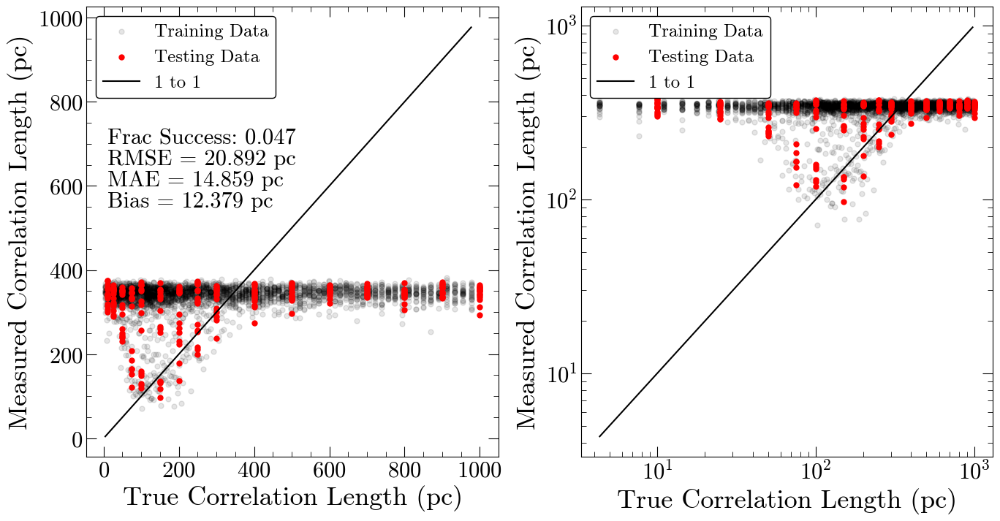

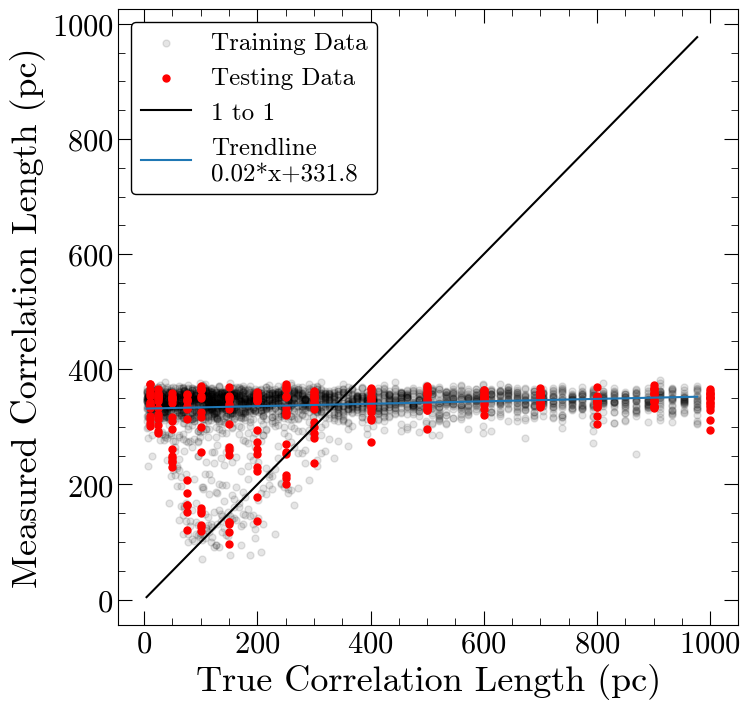

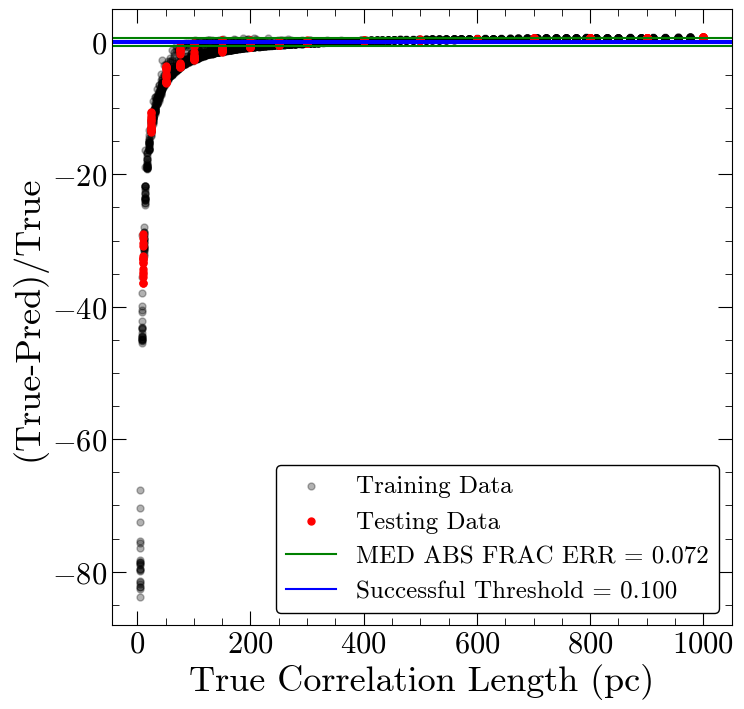

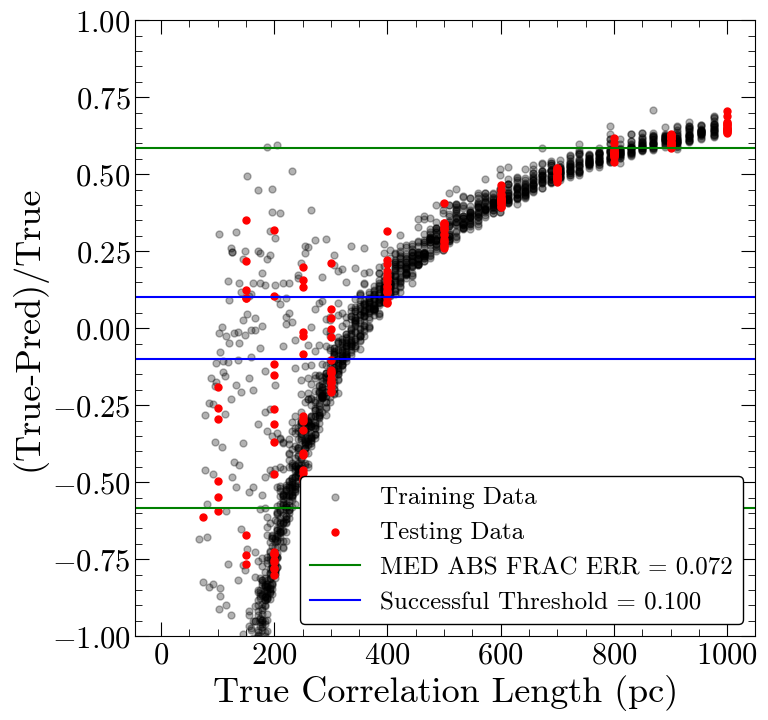

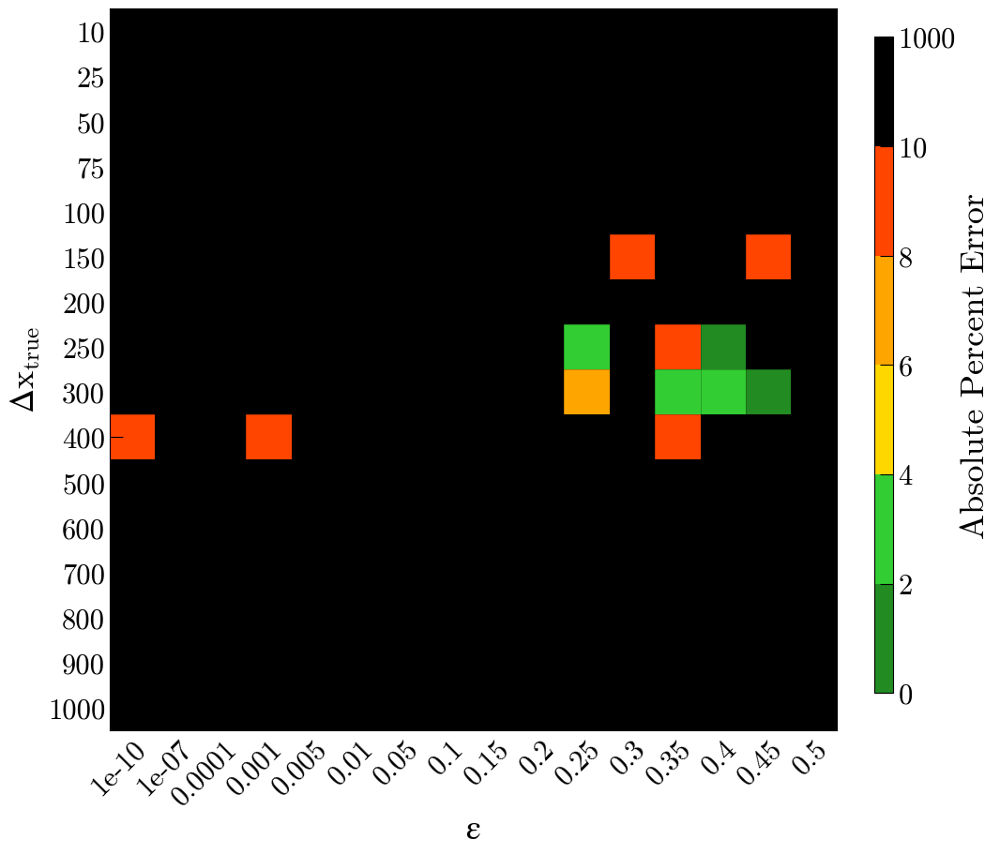

Number of squares with abs percent err>10%,  244


In [37]:
#model with more layers, increase max pooling in first layer
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 1s 9ms/step - loss: 103959.9141
Epoch 2/100
92/92 [==============================] - 1s 7ms/step - loss: 68381.4766
Epoch 3/100
92/92 [==============================] - 1s 9ms/step - loss: 68132.3906
Epoch 4/100
92/92 [==============================] - 1s 8ms/step - loss: 68628.0625
Epoch 5/100
92/92 [==============================] - 1s 8ms/step - loss: 68275.5078
Epoch 6/100
92/92 [==============================] - 1s 8ms/step - loss: 68018.9688
Epoch 7/100
92/92 [==============================] - 1s 8ms/step - loss: 68249.4844
Epoch 8/100
92/92 [==============================] - 1s 9ms/step - loss: 68644.2969
Epoch 9/100
92/92 [==============================] - 1s 8ms/step - loss: 68108.2344
Epoch 10/100
92/92 [==============================] - 1s 9ms/step - loss: 68236.2109
Epoch 11/100
92/92 [==============================] - 1s 9ms/step - loss: 68067.3984
Epoch 12/100
92/92 [==============================] - 1s 7ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 255.112 pc
MAE: 187.756 pc
BIAS: -60.228 pc
MED FRAC ERR: 0.600 

Training Stats, Successful Fits
Frac Success Fit: 0.069 
RMSE: 15.808 pc
MAE: 12.422 pc
BIAS: 2.197 pc
MED FRAC ERR: 0.046 

Testing Stats
RMSE: 317.526 pc
MAE: 236.921 pc
BIAS: 17.440 pc
MED FRAC ERR: 0.601 

Testing Stats, Successful Fits
Frac Success Fit: 0.055 
RMSE: 14.114 pc
MAE: 12.582 pc
BIAS: -1.093 pc
MED FRAC ERR: 0.052 


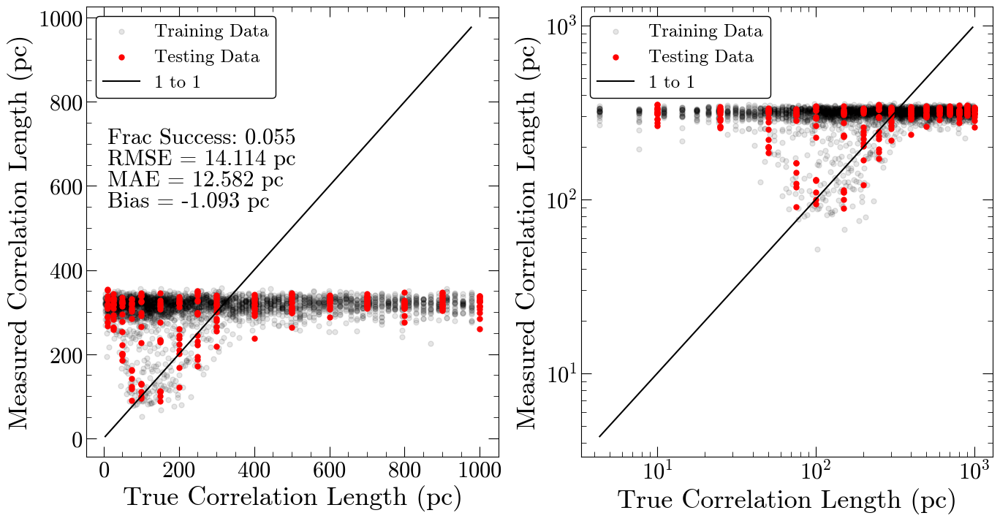

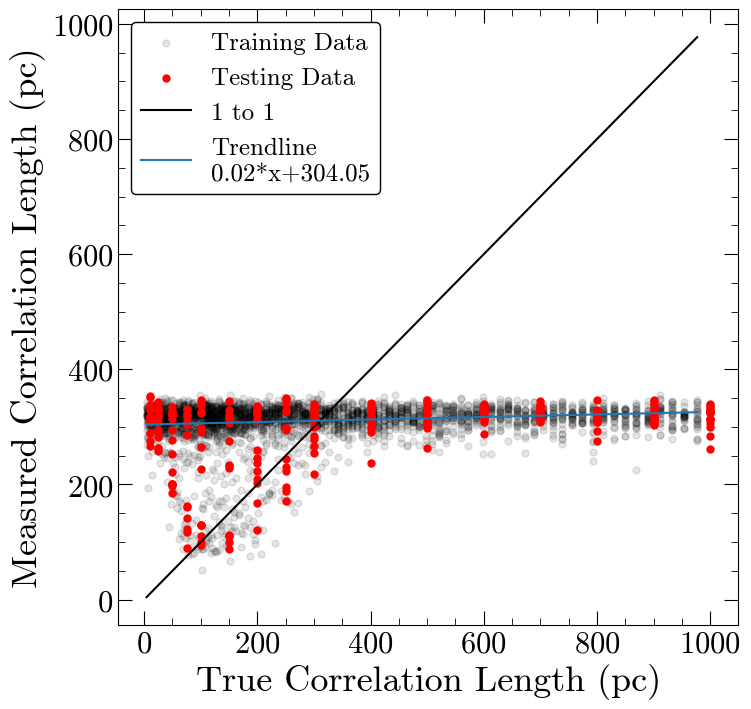

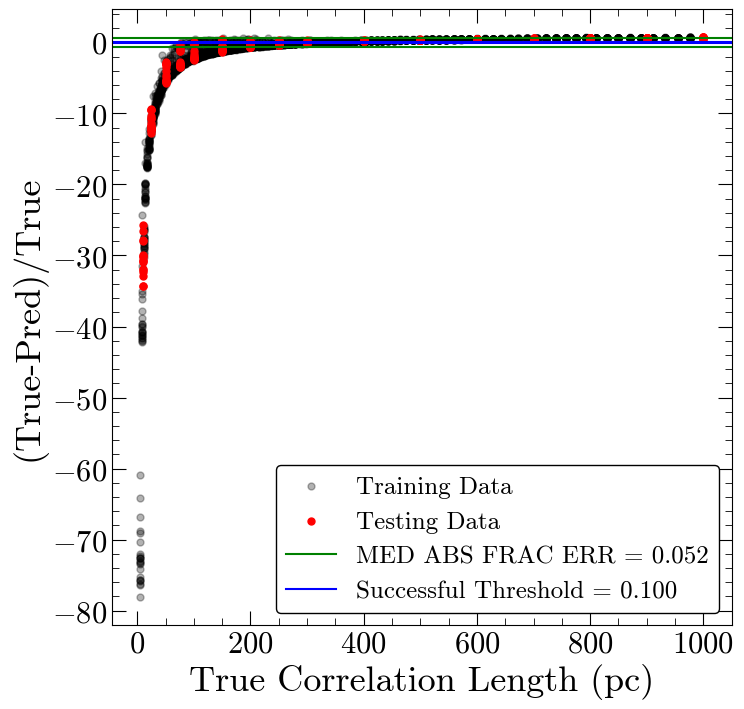

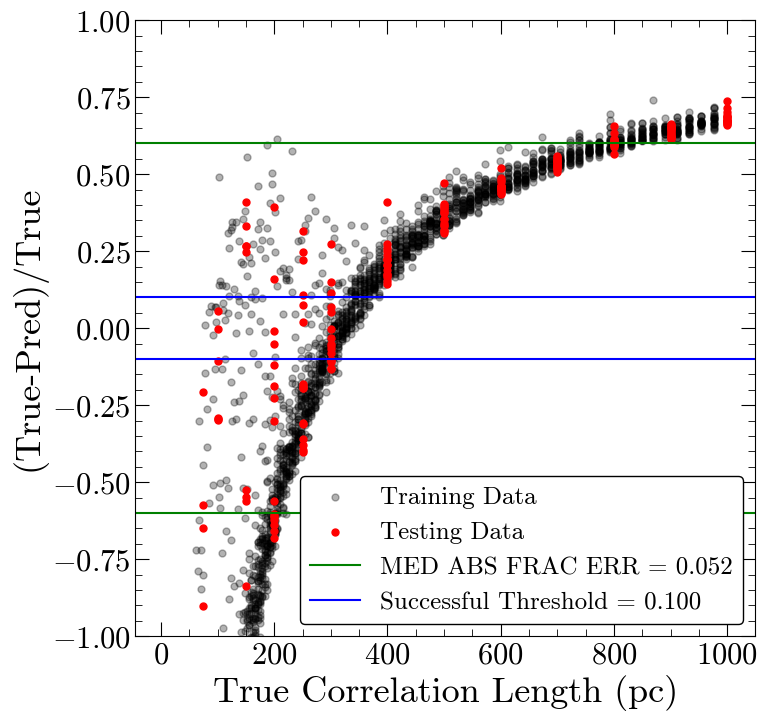

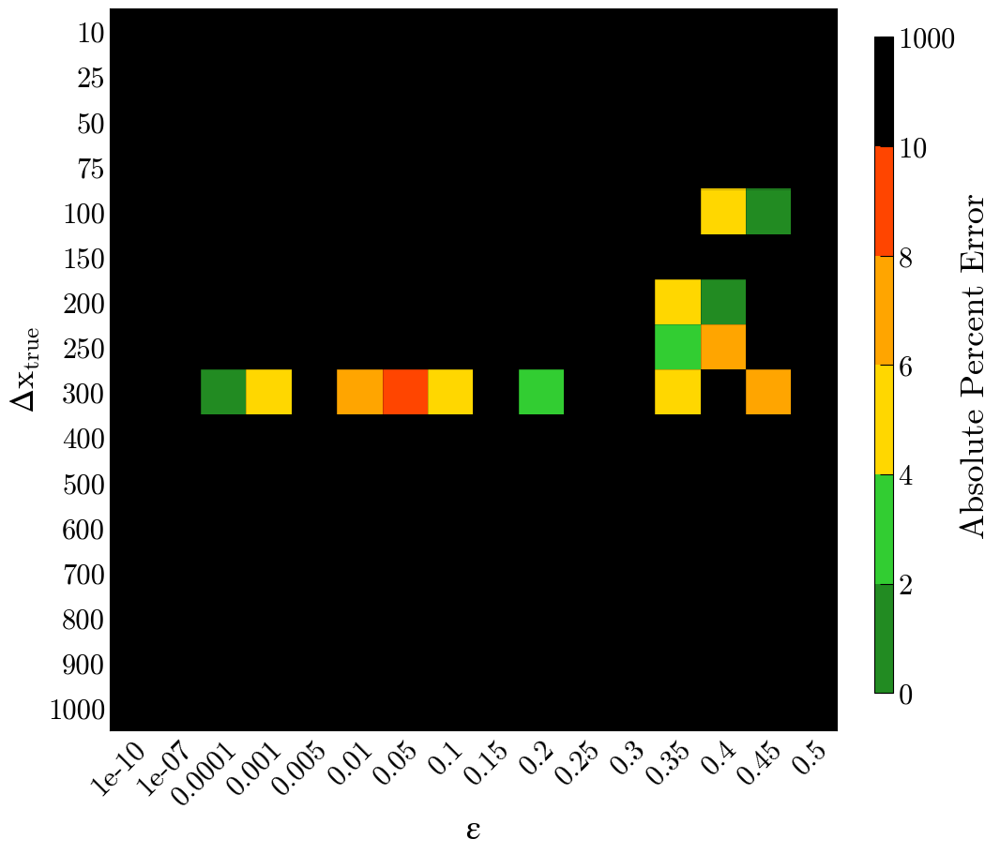

Number of squares with abs percent err>10%,  242


In [38]:
#model with more layers, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 2s 9ms/step - loss: 108194.3438
Epoch 2/200
92/92 [==============================] - 1s 9ms/step - loss: 68807.5078
Epoch 3/200
92/92 [==============================] - 1s 9ms/step - loss: 68291.1641
Epoch 4/200
92/92 [==============================] - 1s 9ms/step - loss: 68317.1719
Epoch 5/200
92/92 [==============================] - 1s 9ms/step - loss: 68118.3359
Epoch 6/200
92/92 [==============================] - 1s 8ms/step - loss: 67960.1016
Epoch 7/200
92/92 [==============================] - 1s 8ms/step - loss: 67816.5000
Epoch 8/200
92/92 [==============================] - 1s 9ms/step - loss: 67782.7109
Epoch 9/200
92/92 [==============================] - 1s 10ms/step - loss: 67814.9609
Epoch 10/200
92/92 [==============================] - 1s 10ms/step - loss: 67835.7578
Epoch 11/200
92/92 [==============================] - 1s 9ms/step - loss: 67138.0703
Epoch 12/200
92/92 [==============================] - 1s 9ms/step - los

Epoch 192/200
92/92 [==============================] - 1s 9ms/step - loss: 65061.5117
Epoch 193/200
92/92 [==============================] - 1s 9ms/step - loss: 65009.5117
Epoch 194/200
92/92 [==============================] - 1s 10ms/step - loss: 65238.3086
Epoch 195/200
92/92 [==============================] - 1s 10ms/step - loss: 65285.3477
Epoch 196/200
92/92 [==============================] - 1s 12ms/step - loss: 65206.2734
Epoch 197/200
92/92 [==============================] - 1s 10ms/step - loss: 65307.8750
Epoch 198/200
92/92 [==============================] - 1s 8ms/step - loss: 65438.1250
Epoch 199/200
92/92 [==============================] - 1s 9ms/step - loss: 65024.0117
Epoch 200/200
92/92 [==============================] - 1s 9ms/step - loss: 65105.2617

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 254.936 pc
MAE: 197.252 pc
BIAS: -77.195 pc
MED FRAC ERR: 0.592 

Training Stats, Successful Fits
Frac Success Fit: 0.079 
RMSE: 18.744 pc
MAE: 15.794 pc
BIAS: 1.570 pc
MED FRAC ERR: 0.052 

Testing Stats
RMSE: 312.574 pc
MAE: 245.306 pc
BIAS: -9.516 pc
MED FRAC ERR: 0.582 

Testing Stats, Successful Fits
Frac Success Fit: 0.047 
RMSE: 15.379 pc
MAE: 13.150 pc
BIAS: -1.511 pc
MED FRAC ERR: 0.051 


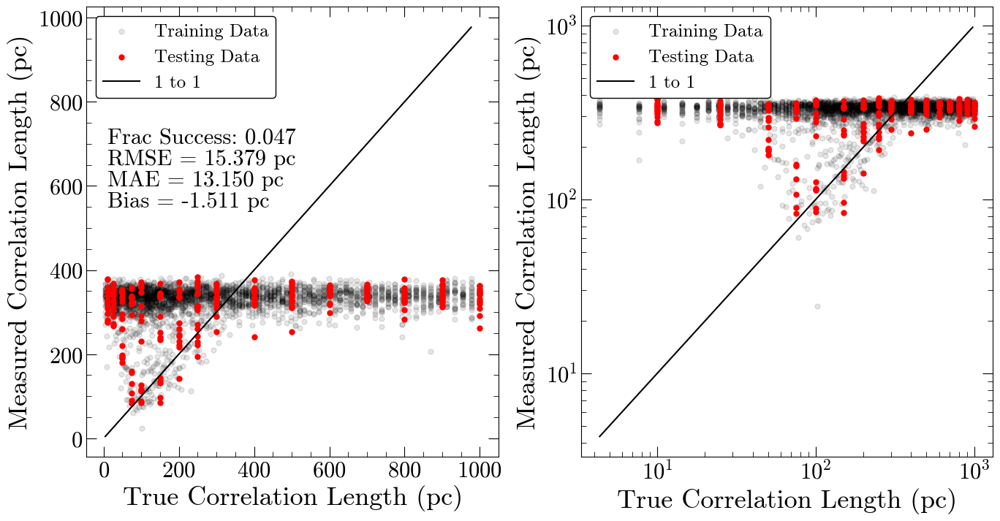

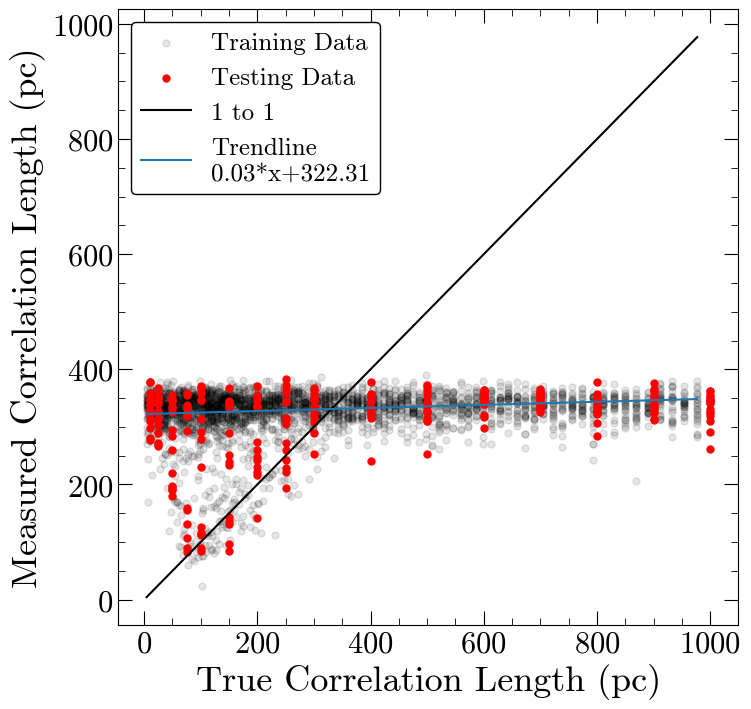

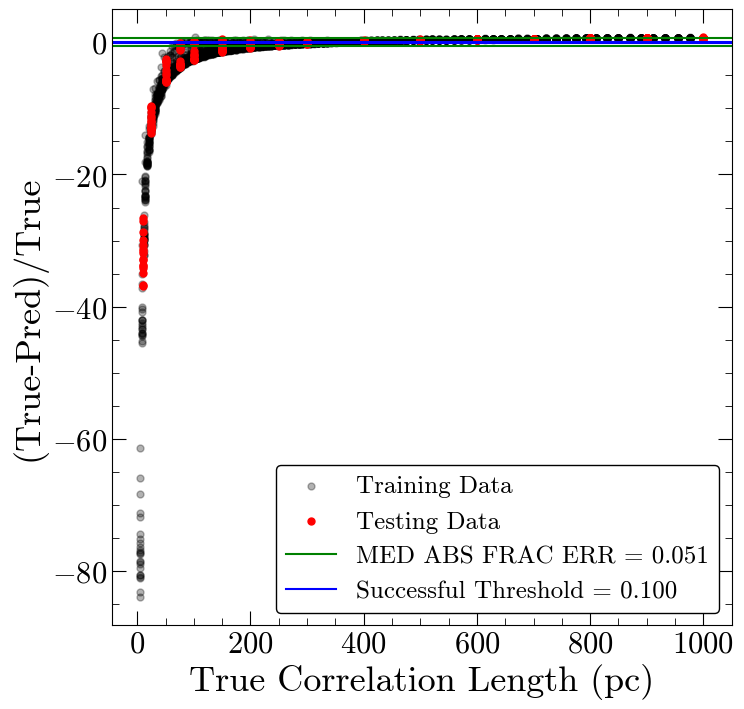

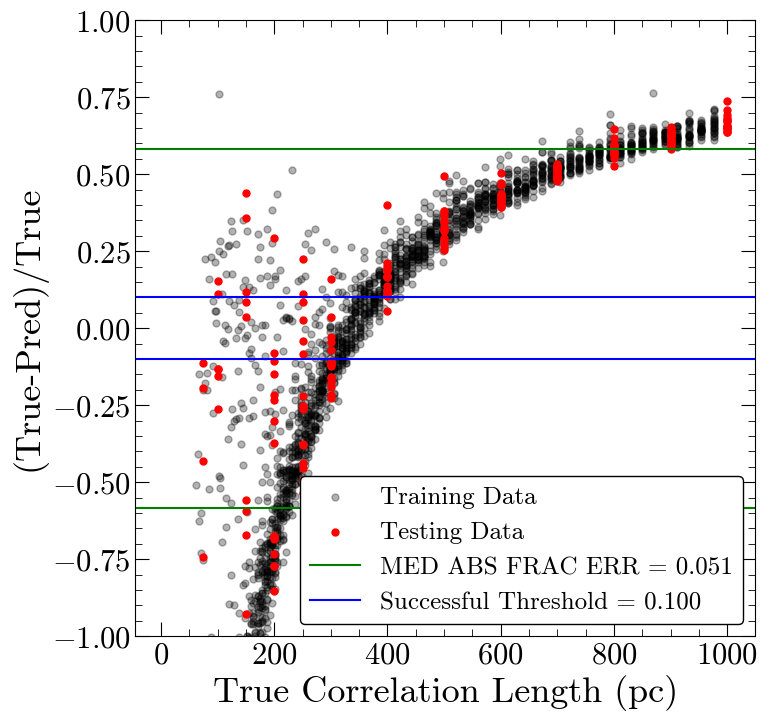

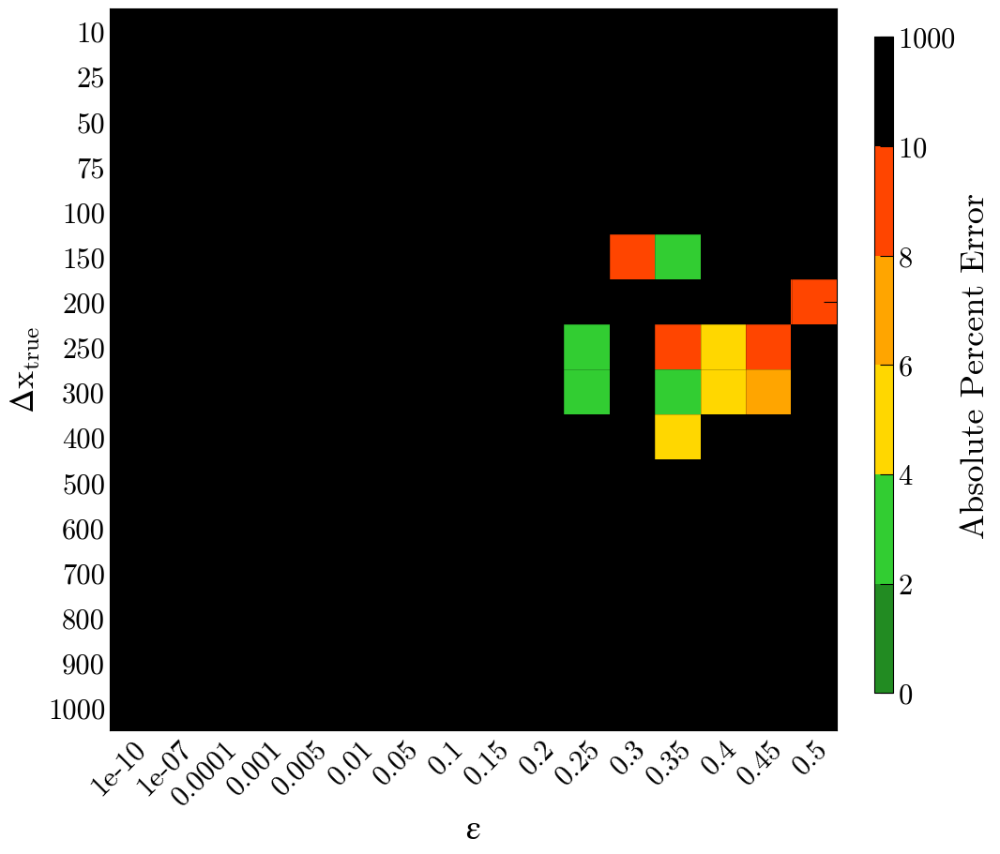

Number of squares with abs percent err>10%,  244


In [39]:
#model with more layers, run for more epochs, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 1s 10ms/step - loss: 101560.8984
Epoch 2/400
92/92 [==============================] - 1s 10ms/step - loss: 68288.8281
Epoch 3/400
92/92 [==============================] - 1s 10ms/step - loss: 68664.3984
Epoch 4/400
92/92 [==============================] - 1s 9ms/step - loss: 68213.2656
Epoch 5/400
92/92 [==============================] - 1s 11ms/step - loss: 68031.1641
Epoch 6/400
92/92 [==============================] - 1s 9ms/step - loss: 68010.6094
Epoch 7/400
92/92 [==============================] - 1s 10ms/step - loss: 68181.0156
Epoch 8/400
92/92 [==============================] - 1s 10ms/step - loss: 67909.2656
Epoch 9/400
92/92 [==============================] - 1s 10ms/step - loss: 68006.1250
Epoch 10/400
92/92 [==============================] - 1s 9ms/step - loss: 68457.9844
Epoch 11/400
92/92 [==============================] - 1s 10ms/step - loss: 67918.1016
Epoch 12/400
92/92 [==============================] - 1s 14ms/ste

92/92 [==============================] - 1s 11ms/step - loss: 64885.9258
Epoch 191/400
92/92 [==============================] - 1s 10ms/step - loss: 65131.3438
Epoch 192/400
92/92 [==============================] - 1s 10ms/step - loss: 65037.2266
Epoch 193/400
92/92 [==============================] - 1s 10ms/step - loss: 64959.0430
Epoch 194/400
92/92 [==============================] - 1s 10ms/step - loss: 65172.7539
Epoch 195/400
92/92 [==============================] - 1s 10ms/step - loss: 64949.8867
Epoch 196/400
92/92 [==============================] - 1s 10ms/step - loss: 65067.3711
Epoch 197/400
92/92 [==============================] - 1s 10ms/step - loss: 64847.0352
Epoch 198/400
92/92 [==============================] - 1s 11ms/step - loss: 65018.9766
Epoch 199/400
92/92 [==============================] - 1s 10ms/step - loss: 65114.0391
Epoch 200/400
92/92 [==============================] - 1s 10ms/step - loss: 64930.7617
Epoch 201/400
92/92 [==============================] - 1s

92/92 [==============================] - 1s 11ms/step - loss: 64759.3984
Epoch 379/400
92/92 [==============================] - 1s 12ms/step - loss: 64612.5312
Epoch 380/400
92/92 [==============================] - 1s 10ms/step - loss: 64625.7188
Epoch 381/400
92/92 [==============================] - 1s 10ms/step - loss: 64361.2969
Epoch 382/400
92/92 [==============================] - 1s 10ms/step - loss: 64510.8555
Epoch 383/400
92/92 [==============================] - 1s 10ms/step - loss: 64273.6914
Epoch 384/400
92/92 [==============================] - 1s 11ms/step - loss: 64261.0234
Epoch 385/400
92/92 [==============================] - 1s 10ms/step - loss: 64548.8477
Epoch 386/400
92/92 [==============================] - 1s 10ms/step - loss: 64359.5039
Epoch 387/400
92/92 [==============================] - 1s 10ms/step - loss: 64311.1328
Epoch 388/400
92/92 [==============================] - 1s 10ms/step - loss: 64254.8125
Epoch 389/400
92/92 [==============================] - 1s

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 253.031 pc
MAE: 191.740 pc
BIAS: -68.279 pc
MED FRAC ERR: 0.585 

Training Stats, Successful Fits
Frac Success Fit: 0.097 
RMSE: 18.397 pc
MAE: 14.678 pc
BIAS: 1.251 pc
MED FRAC ERR: 0.050 

Testing Stats
RMSE: 310.750 pc
MAE: 221.344 pc
BIAS: -6.046 pc
MED FRAC ERR: 0.563 

Testing Stats, Successful Fits
Frac Success Fit: 0.102 
RMSE: 15.415 pc
MAE: 7.678 pc
BIAS: -5.040 pc
MED FRAC ERR: 0.055 


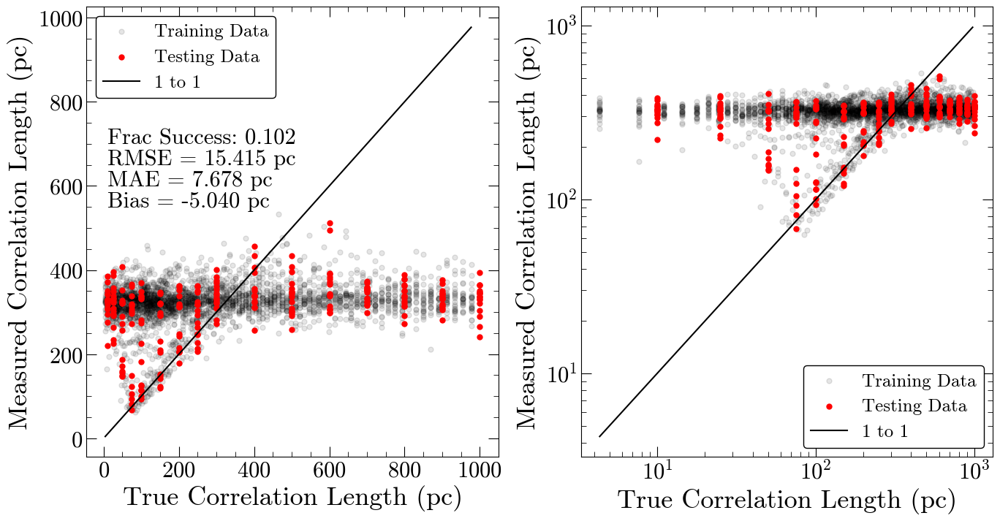

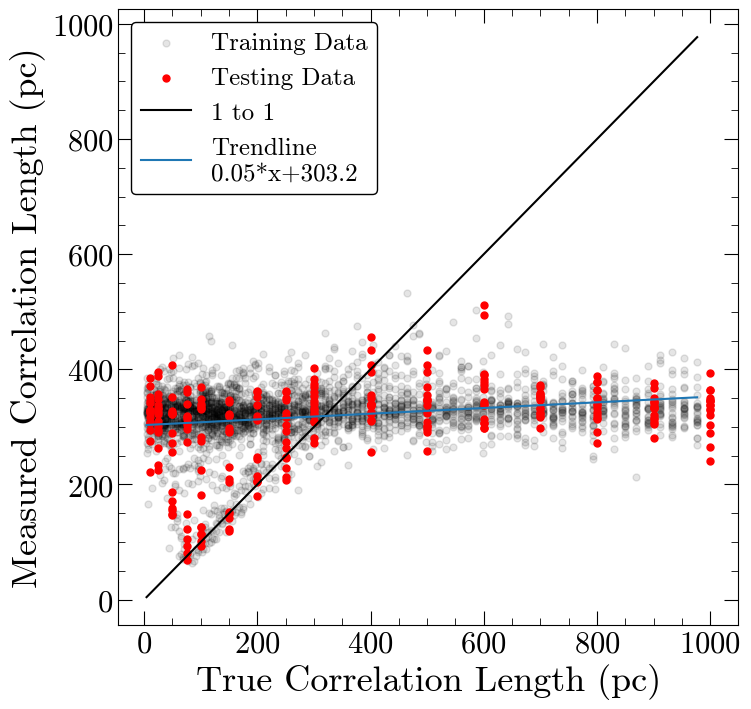

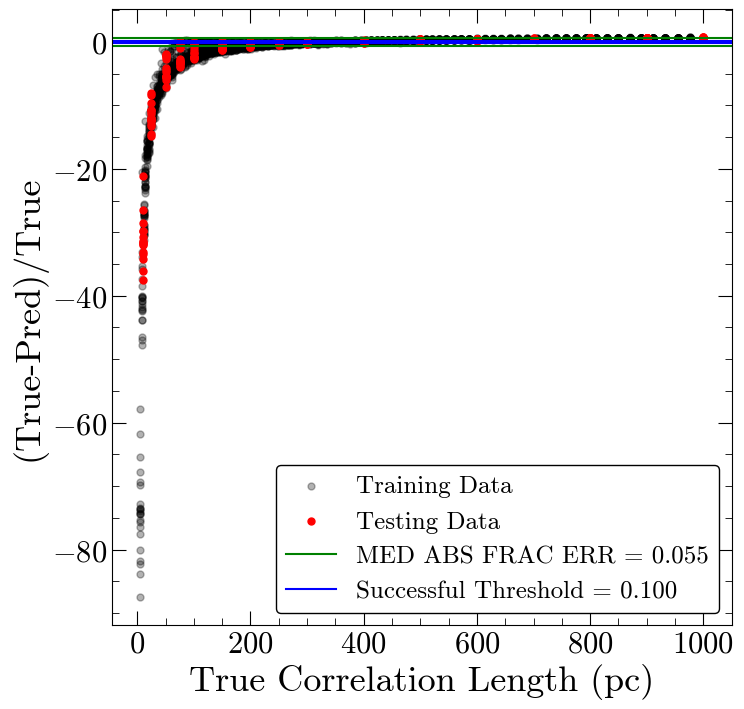

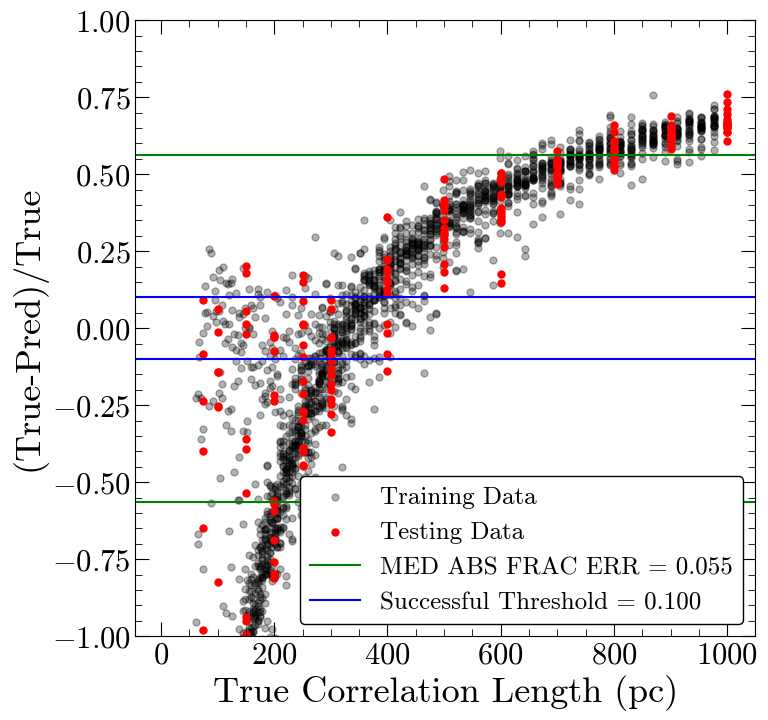

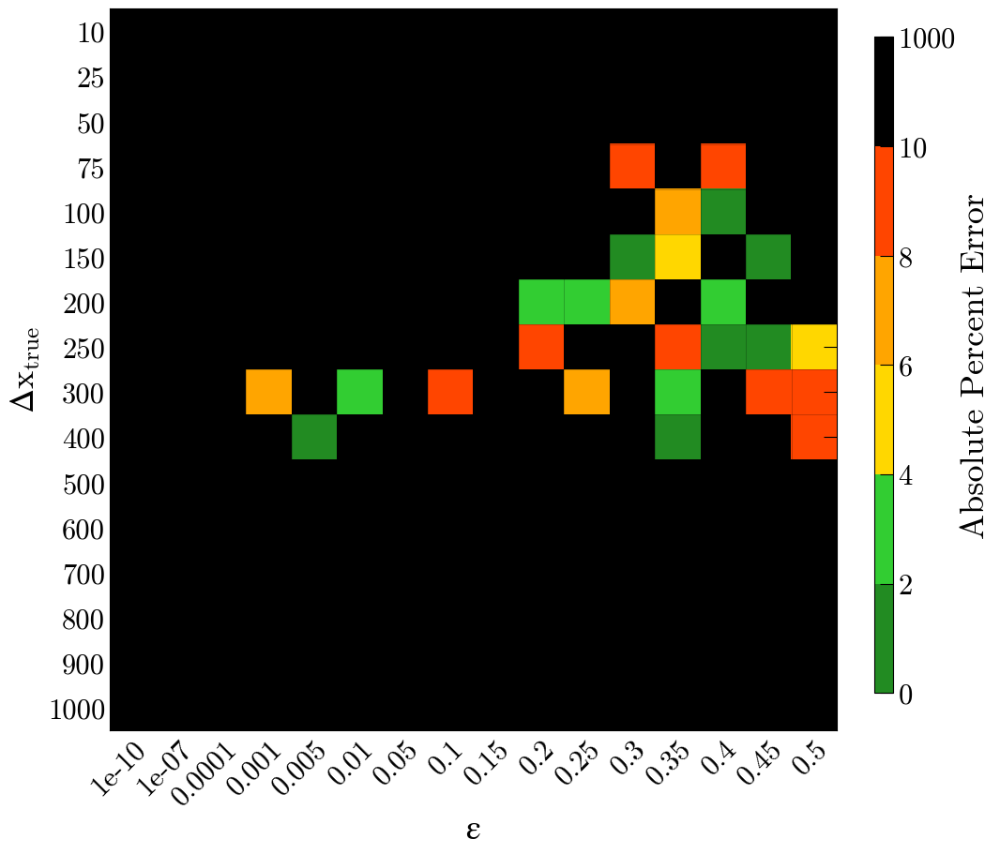

Number of squares with abs percent err>10%,  230


In [40]:
#model with more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 2s 11ms/step - loss: 95933.8984
Epoch 2/400
92/92 [==============================] - 1s 10ms/step - loss: 68692.8672
Epoch 3/400
92/92 [==============================] - 1s 11ms/step - loss: 68572.8984
Epoch 4/400
92/92 [==============================] - 1s 11ms/step - loss: 69117.9219
Epoch 5/400
92/92 [==============================] - 1s 12ms/step - loss: 69197.5000
Epoch 6/400
92/92 [==============================] - 1s 11ms/step - loss: 68354.4219
Epoch 7/400
92/92 [==============================] - 1s 11ms/step - loss: 69134.7266
Epoch 8/400
92/92 [==============================] - 1s 11ms/step - loss: 68513.3516
Epoch 9/400
92/92 [==============================] - 1s 9ms/step - loss: 68481.8828
Epoch 10/400
92/92 [==============================] - 1s 11ms/step - loss: 67889.4844
Epoch 11/400
92/92 [==============================] - 1s 11ms/step - loss: 67186.1328
Epoch 12/400
92/92 [==============================] - 1s 10ms/st

92/92 [==============================] - 1s 11ms/step - loss: 65410.9805
Epoch 191/400
92/92 [==============================] - 1s 10ms/step - loss: 64998.4258
Epoch 192/400
92/92 [==============================] - 1s 13ms/step - loss: 64827.2031
Epoch 193/400
92/92 [==============================] - 1s 12ms/step - loss: 64777.2305
Epoch 194/400
92/92 [==============================] - 1s 12ms/step - loss: 64623.5820
Epoch 195/400
92/92 [==============================] - 1s 11ms/step - loss: 64749.4023
Epoch 196/400
92/92 [==============================] - 1s 13ms/step - loss: 64752.6406
Epoch 197/400
92/92 [==============================] - 1s 10ms/step - loss: 64801.9492
Epoch 198/400
92/92 [==============================] - 1s 10ms/step - loss: 65228.8711
Epoch 199/400
92/92 [==============================] - 1s 12ms/step - loss: 64860.5508
Epoch 200/400
92/92 [==============================] - 1s 12ms/step - loss: 64766.8867
Epoch 201/400
92/92 [==============================] - 1s

92/92 [==============================] - 1s 12ms/step - loss: 63335.0625
Epoch 379/400
92/92 [==============================] - 1s 13ms/step - loss: 63645.5586
Epoch 380/400
92/92 [==============================] - 1s 12ms/step - loss: 63517.5117
Epoch 381/400
92/92 [==============================] - 1s 12ms/step - loss: 63733.1602
Epoch 382/400
92/92 [==============================] - 1s 12ms/step - loss: 63506.2695
Epoch 383/400
92/92 [==============================] - 1s 11ms/step - loss: 63193.4062
Epoch 384/400
92/92 [==============================] - 1s 12ms/step - loss: 63805.4570
Epoch 385/400
92/92 [==============================] - 1s 12ms/step - loss: 63675.3672
Epoch 386/400
92/92 [==============================] - 1s 11ms/step - loss: 63470.2695
Epoch 387/400
92/92 [==============================] - 1s 12ms/step - loss: 63577.2188
Epoch 388/400
92/92 [==============================] - 1s 11ms/step - loss: 63389.4414
Epoch 389/400
92/92 [==============================] - 1s

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 250.681 pc
MAE: 177.476 pc
BIAS: -36.931 pc
MED FRAC ERR: 0.568 

Training Stats, Successful Fits
Frac Success Fit: 0.116 
RMSE: 16.099 pc
MAE: 10.778 pc
BIAS: 0.591 pc
MED FRAC ERR: 0.050 

Testing Stats
RMSE: 315.443 pc
MAE: 219.620 pc
BIAS: 4.905 pc
MED FRAC ERR: 0.540 

Testing Stats, Successful Fits
Frac Success Fit: 0.184 
RMSE: 13.057 pc
MAE: 8.282 pc
BIAS: 0.973 pc
MED FRAC ERR: 0.045 


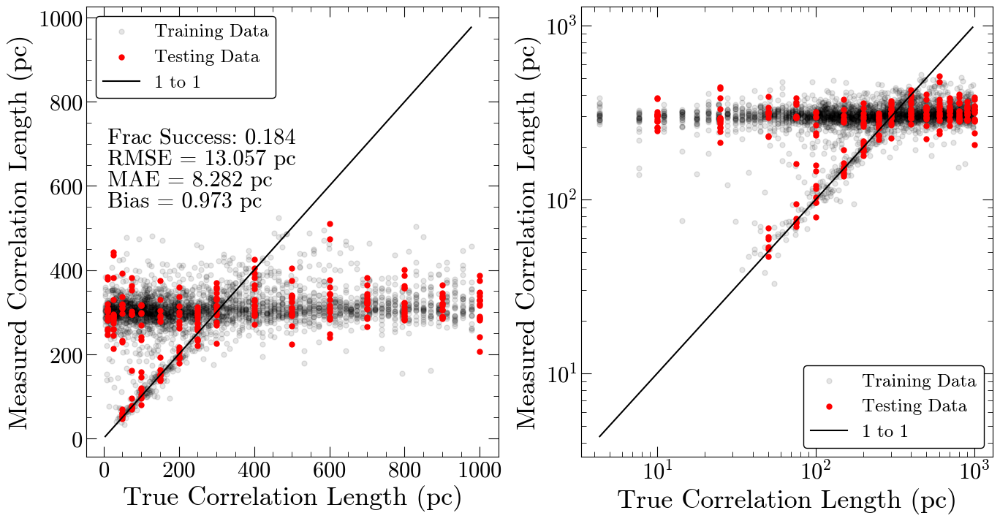

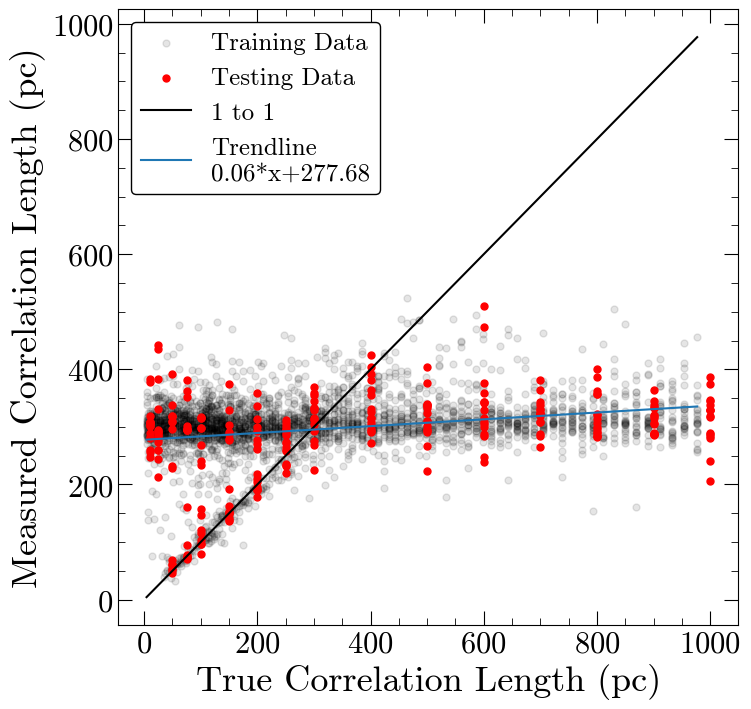

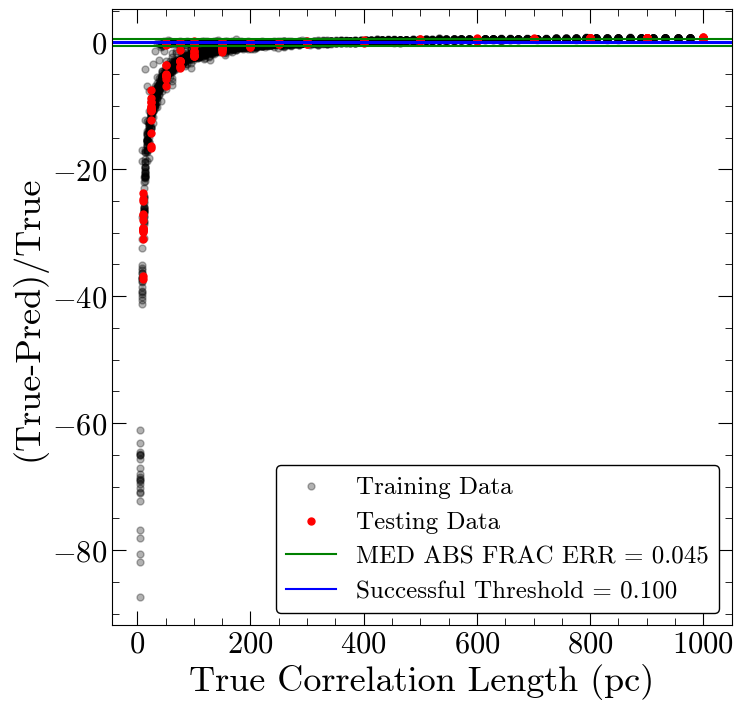

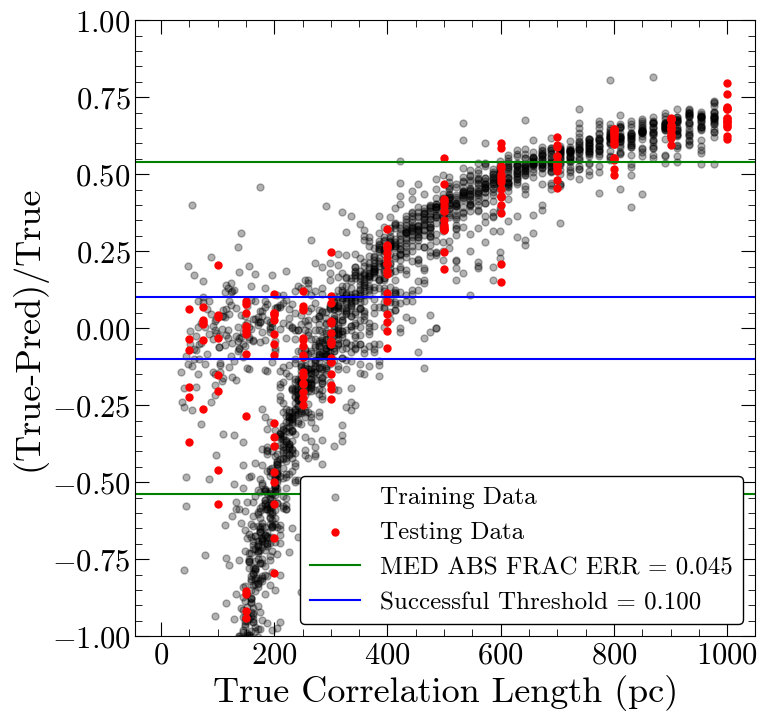

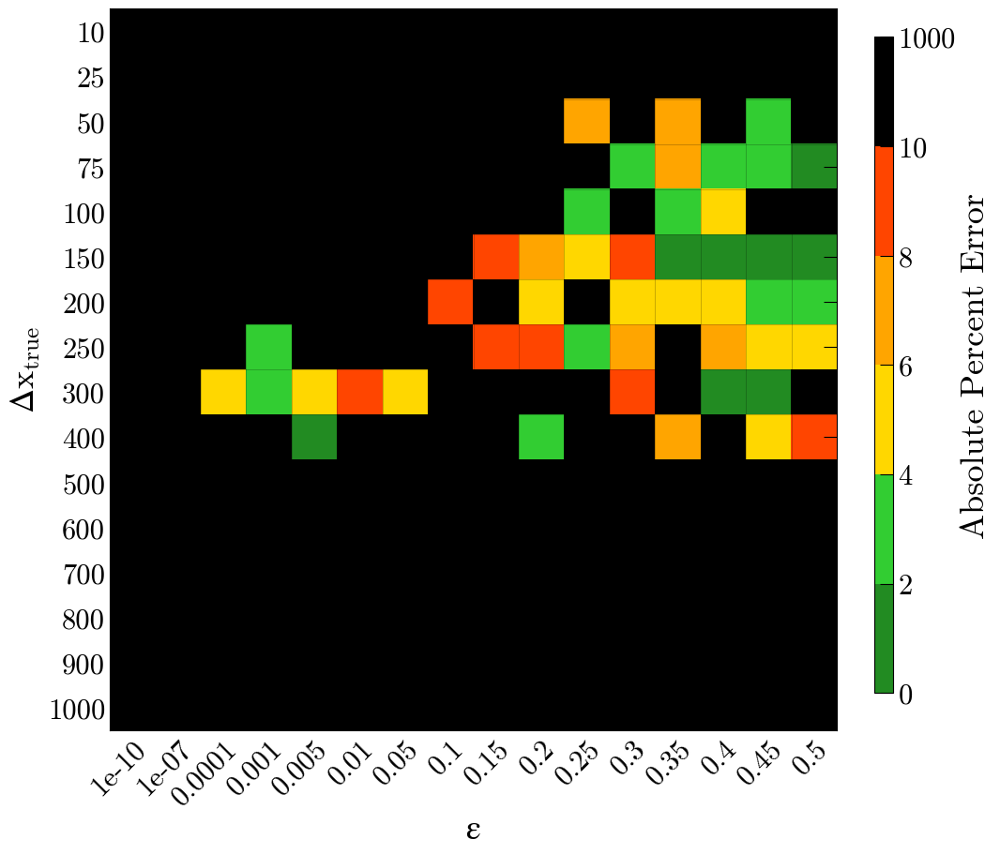

Number of squares with abs percent err>10%,  209


In [41]:
#model with even more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
46/46 [==============================] - 1s 16ms/step - loss: 132753.0938
Epoch 2/400
46/46 [==============================] - 1s 12ms/step - loss: 68964.1875
Epoch 3/400
46/46 [==============================] - 1s 13ms/step - loss: 68997.9766
Epoch 4/400
46/46 [==============================] - 1s 15ms/step - loss: 68114.0234
Epoch 5/400
46/46 [==============================] - 1s 14ms/step - loss: 67961.8438
Epoch 6/400
46/46 [==============================] - 1s 14ms/step - loss: 67988.6719
Epoch 7/400
46/46 [==============================] - 1s 14ms/step - loss: 67848.3125
Epoch 8/400
46/46 [==============================] - 1s 14ms/step - loss: 67854.9297
Epoch 9/400
46/46 [==============================] - 1s 15ms/step - loss: 67937.0547
Epoch 10/400
46/46 [==============================] - 1s 14ms/step - loss: 67585.7891
Epoch 11/400
46/46 [==============================] - 1s 14ms/step - loss: 67657.3906
Epoch 12/400
46/46 [==============================] - 1s 15ms/

46/46 [==============================] - 1s 15ms/step - loss: 65212.4336
Epoch 191/400
46/46 [==============================] - 1s 17ms/step - loss: 65142.2812
Epoch 192/400
46/46 [==============================] - 1s 15ms/step - loss: 65153.8828
Epoch 193/400
46/46 [==============================] - 1s 14ms/step - loss: 65174.5586
Epoch 194/400
46/46 [==============================] - 1s 15ms/step - loss: 65078.3164
Epoch 195/400
46/46 [==============================] - 1s 15ms/step - loss: 65565.2812
Epoch 196/400
46/46 [==============================] - 1s 16ms/step - loss: 65220.8203
Epoch 197/400
46/46 [==============================] - 1s 14ms/step - loss: 65213.7695
Epoch 198/400
46/46 [==============================] - 1s 19ms/step - loss: 65079.8125
Epoch 199/400
46/46 [==============================] - 1s 15ms/step - loss: 65290.5703
Epoch 200/400
46/46 [==============================] - 1s 19ms/step - loss: 65115.1211
Epoch 201/400
46/46 [==============================] - 1s

46/46 [==============================] - 0s 9ms/step - loss: 64228.8789
Epoch 379/400
46/46 [==============================] - 0s 10ms/step - loss: 64344.0078
Epoch 380/400
46/46 [==============================] - 0s 9ms/step - loss: 64085.1641
Epoch 381/400
46/46 [==============================] - 0s 10ms/step - loss: 64091.4961
Epoch 382/400
46/46 [==============================] - 0s 10ms/step - loss: 64269.9531
Epoch 383/400
46/46 [==============================] - 0s 10ms/step - loss: 64159.8945
Epoch 384/400
46/46 [==============================] - 0s 8ms/step - loss: 64351.6914
Epoch 385/400
46/46 [==============================] - 0s 10ms/step - loss: 64319.3867
Epoch 386/400
46/46 [==============================] - 0s 10ms/step - loss: 64412.0742
Epoch 387/400
46/46 [==============================] - 0s 10ms/step - loss: 64276.4258
Epoch 388/400
46/46 [==============================] - 0s 10ms/step - loss: 64363.3555
Epoch 389/400
46/46 [==============================] - 0s 9m

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 252.892 pc
MAE: 181.599 pc
BIAS: -46.096 pc
MED FRAC ERR: 0.583 

Training Stats, Successful Fits
Frac Success Fit: 0.109 
RMSE: 16.707 pc
MAE: 12.410 pc
BIAS: 3.017 pc
MED FRAC ERR: 0.055 

Testing Stats
RMSE: 314.940 pc
MAE: 215.625 pc
BIAS: 12.207 pc
MED FRAC ERR: 0.555 

Testing Stats, Successful Fits
Frac Success Fit: 0.133 
RMSE: 15.298 pc
MAE: 11.522 pc
BIAS: 5.958 pc
MED FRAC ERR: 0.063 


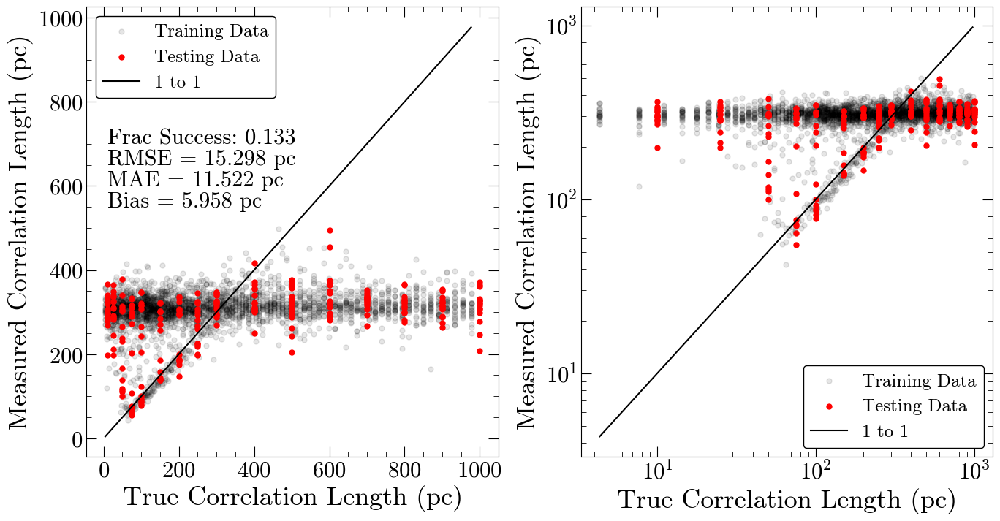

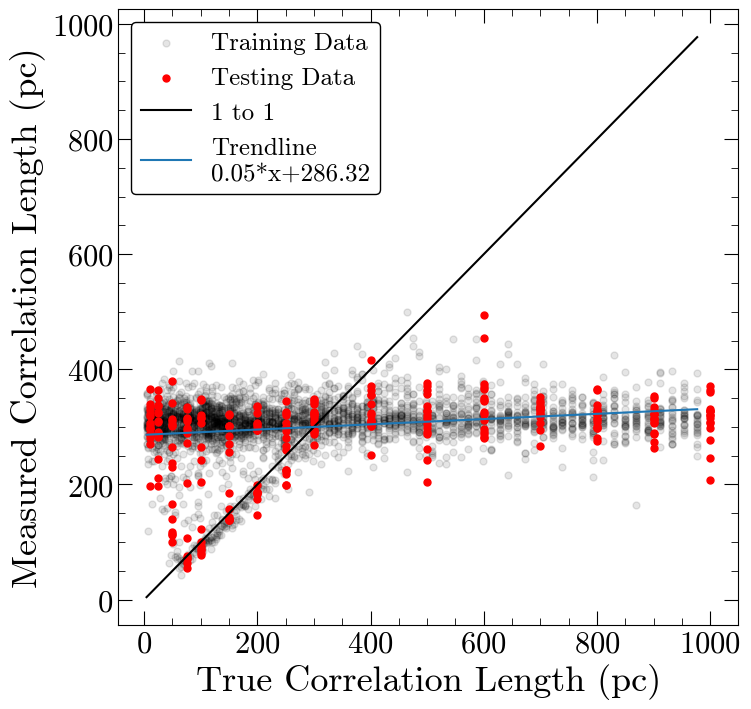

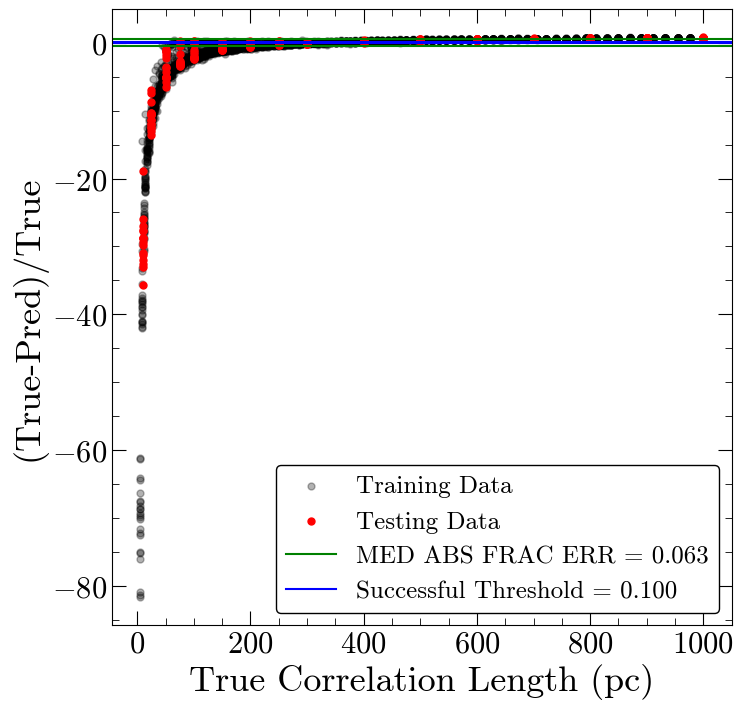

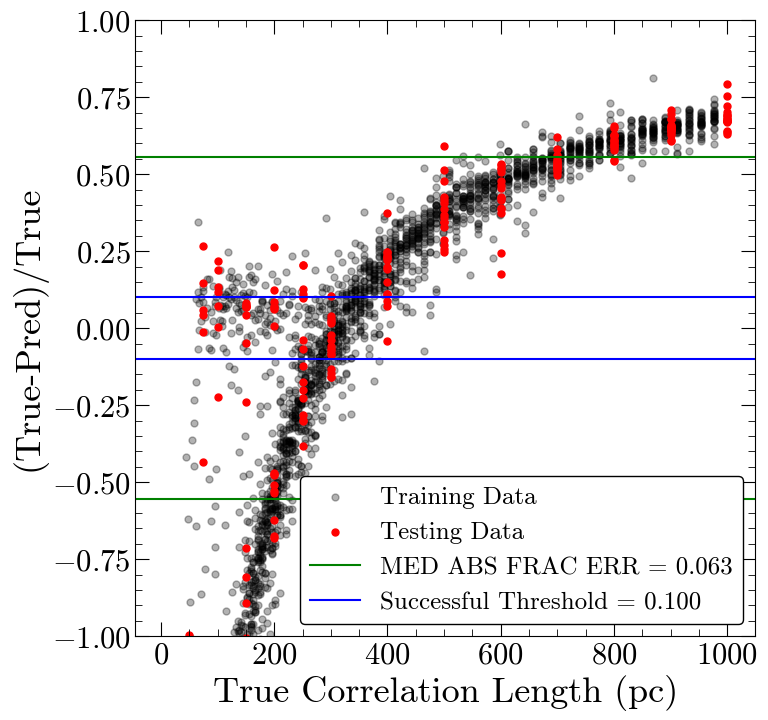

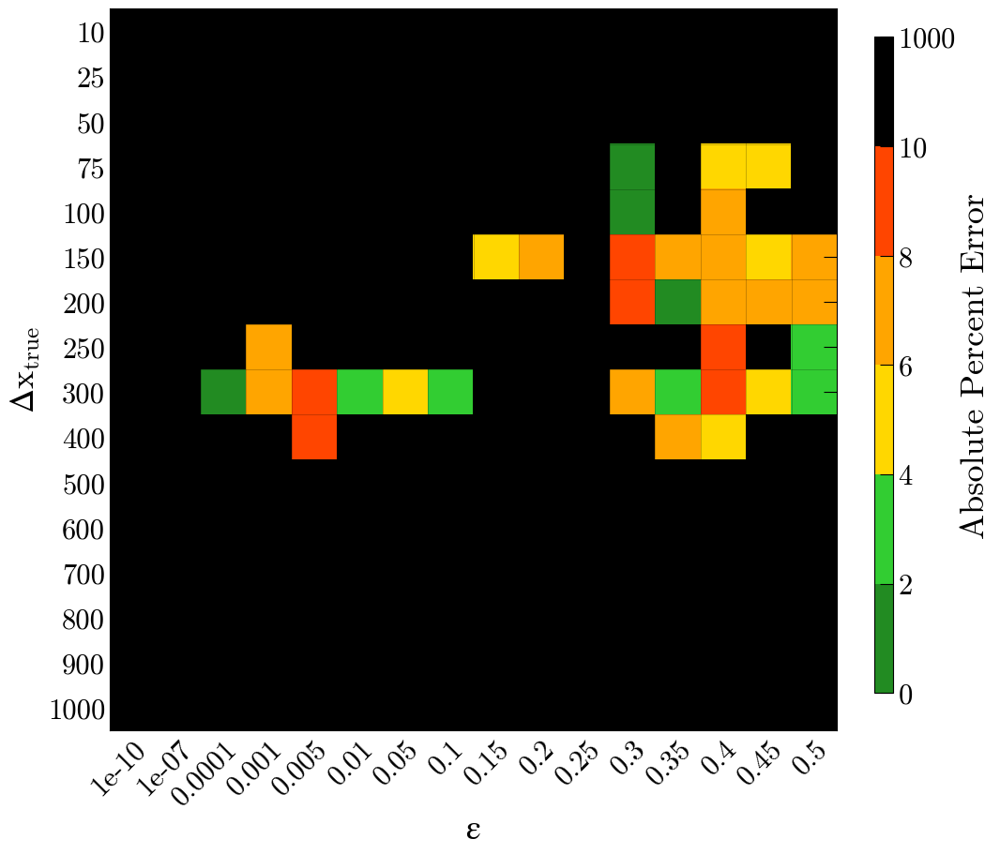

Number of squares with abs percent err>10%,  222


In [42]:
#model with even more layers, run for even more epochs, increase batch size
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=64)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
10/10 [==============================] - 0s 17ms/step - loss: 164129.1094
Epoch 2/400
10/10 [==============================] - 0s 25ms/step - loss: 161241.6406
Epoch 3/400
10/10 [==============================] - 0s 23ms/step - loss: 141827.5000
Epoch 4/400
10/10 [==============================] - 0s 18ms/step - loss: 84866.7812
Epoch 5/400
10/10 [==============================] - 0s 22ms/step - loss: 73790.3594
Epoch 6/400
10/10 [==============================] - 0s 23ms/step - loss: 70254.8828
Epoch 7/400
10/10 [==============================] - 0s 17ms/step - loss: 68411.3750
Epoch 8/400
10/10 [==============================] - 0s 22ms/step - loss: 68035.6250
Epoch 9/400
10/10 [==============================] - 0s 22ms/step - loss: 68173.3125
Epoch 10/400
10/10 [==============================] - 0s 23ms/step - loss: 68005.7500
Epoch 11/400
10/10 [==============================] - 0s 20ms/step - loss: 68032.3906
Epoch 12/400
10/10 [==============================] - 0s 27m

10/10 [==============================] - 0s 13ms/step - loss: 66284.8438
Epoch 191/400
10/10 [==============================] - 0s 12ms/step - loss: 66446.8203
Epoch 192/400
10/10 [==============================] - 0s 13ms/step - loss: 66433.0000
Epoch 193/400
10/10 [==============================] - 0s 13ms/step - loss: 66492.7109
Epoch 194/400
10/10 [==============================] - 0s 12ms/step - loss: 66238.7422
Epoch 195/400
10/10 [==============================] - 0s 13ms/step - loss: 66181.7969
Epoch 196/400
10/10 [==============================] - 0s 12ms/step - loss: 66242.5547
Epoch 197/400
10/10 [==============================] - 0s 12ms/step - loss: 66155.3594
Epoch 198/400
10/10 [==============================] - 0s 13ms/step - loss: 66205.1875
Epoch 199/400
10/10 [==============================] - 0s 12ms/step - loss: 66208.9375
Epoch 200/400
10/10 [==============================] - 0s 13ms/step - loss: 66196.2578
Epoch 201/400
10/10 [==============================] - 0s

10/10 [==============================] - 0s 13ms/step - loss: 65204.5859
Epoch 379/400
10/10 [==============================] - 0s 13ms/step - loss: 65481.6445
Epoch 380/400
10/10 [==============================] - 0s 13ms/step - loss: 65430.0508
Epoch 381/400
10/10 [==============================] - 0s 12ms/step - loss: 65381.2422
Epoch 382/400
10/10 [==============================] - 0s 12ms/step - loss: 65347.1758
Epoch 383/400
10/10 [==============================] - 0s 13ms/step - loss: 65212.6523
Epoch 384/400
10/10 [==============================] - 0s 13ms/step - loss: 65186.8633
Epoch 385/400
10/10 [==============================] - 0s 12ms/step - loss: 65246.6523
Epoch 386/400
10/10 [==============================] - 0s 13ms/step - loss: 65371.0547
Epoch 387/400
10/10 [==============================] - 0s 13ms/step - loss: 65255.2422
Epoch 388/400
10/10 [==============================] - 0s 12ms/step - loss: 65354.4805
Epoch 389/400
10/10 [==============================] - 0s

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 255.313 pc
MAE: 185.313 pc
BIAS: -57.906 pc
MED FRAC ERR: 0.601 

Training Stats, Successful Fits
Frac Success Fit: 0.078 
RMSE: 15.537 pc
MAE: 12.185 pc
BIAS: 2.714 pc
MED FRAC ERR: 0.044 

Testing Stats
RMSE: 319.364 pc
MAE: 232.357 pc
BIAS: -0.532 pc
MED FRAC ERR: 0.604 

Testing Stats, Successful Fits
Frac Success Fit: 0.094 
RMSE: 15.605 pc
MAE: 12.706 pc
BIAS: -3.075 pc
MED FRAC ERR: 0.050 


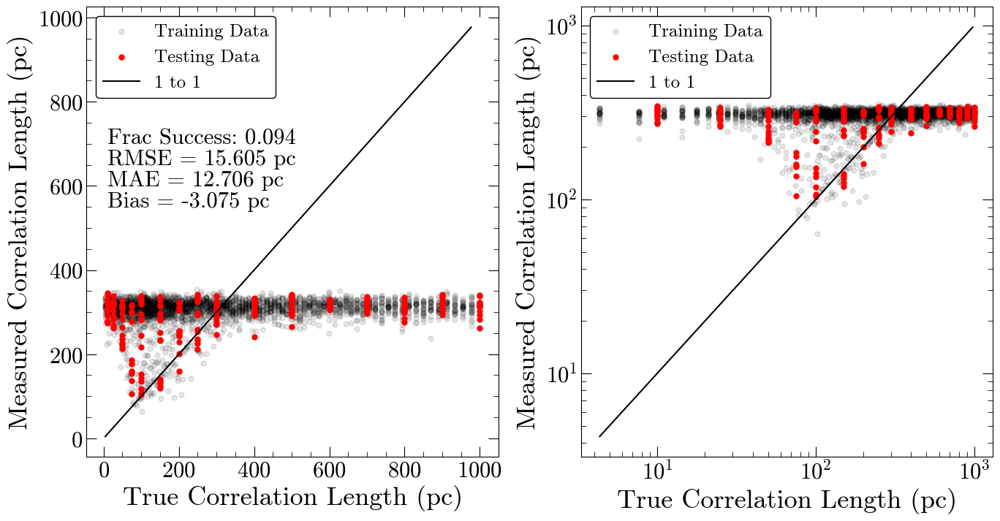

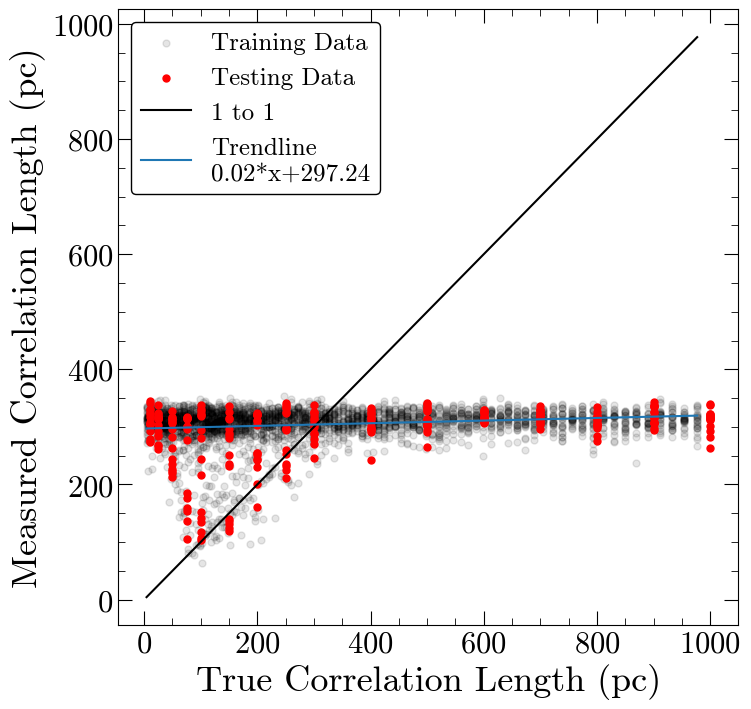

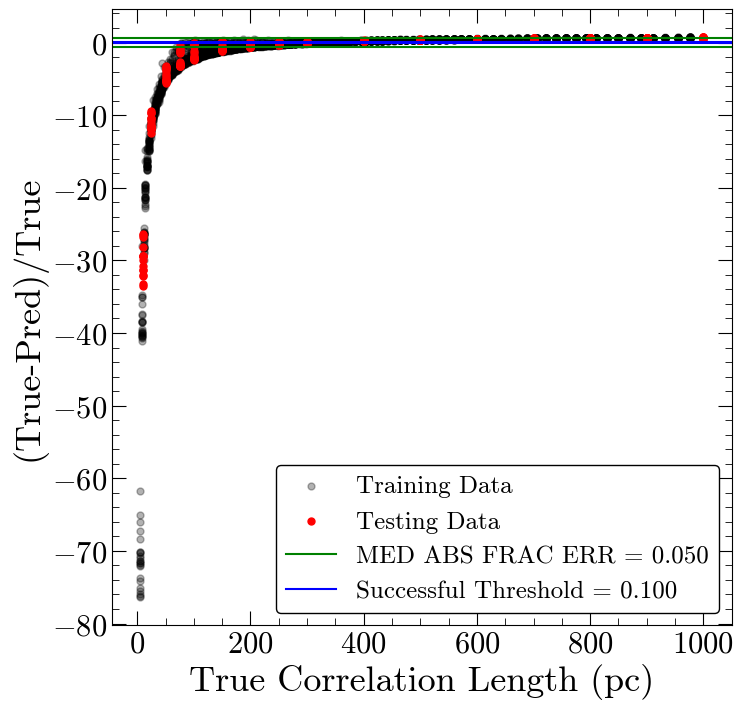

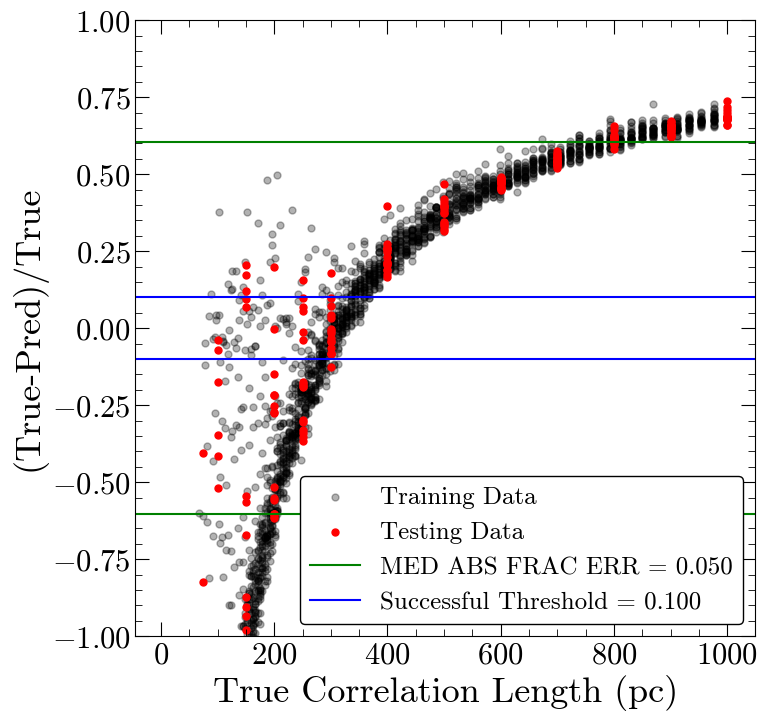

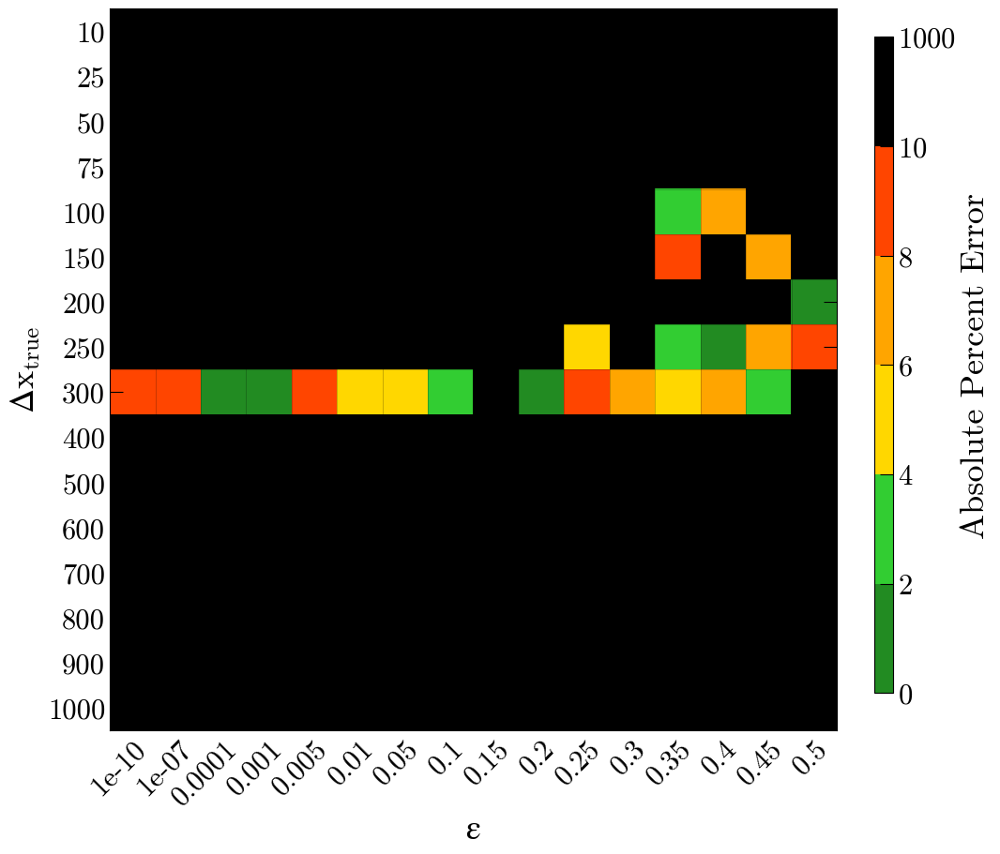

Number of squares with abs percent err>10%,  232


In [43]:
#model with even more layers, run for even more epochs, increase batch size even more
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=300)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

# Save best model

In [44]:
#reset the indices
indices=np.arange(0,len(all_model_stats))
all_model_stats.set_index(indices,inplace=True)
#round all values
all_model_stats=all_model_stats.round(2)

print('Min MAE Training')
print(all_model_stats['mae_training'].idxmin(),', min val=',min(all_model_stats['mae_training']))
print('')

print('Max Frac Success Training')
print(all_model_stats['frac_success_training'].idxmax(),', max val=',max(all_model_stats['frac_success_training']))
print('')

print('Min MAE Testing')
print(all_model_stats['mae_testing'].idxmin(),', min val=',min(all_model_stats['mae_testing']))
print('')

print('Max Frac Success Testing')
print(all_model_stats['frac_success_testing'].idxmax(),', max val=',max(all_model_stats['frac_success_testing']))
print('')

display(all_model_stats)

#best model option is 8


Min MAE Training
8 , min val= 177.48

Max Frac Success Training
8 , max val= 0.12

Min MAE Testing
9 , min val= 215.62

Max Frac Success Testing
8 , max val= 0.18



,mae_training,frac_success_training,mae_testing,frac_success_testing
0,204.96,0.07,251.41,0.06
1,194.11,0.07,245.87,0.05
2,192.78,0.07,241.59,0.05
3,190.99,0.08,236.89,0.05
4,204.45,0.08,249.48,0.05
5,187.76,0.07,236.92,0.05
6,197.25,0.08,245.31,0.05
7,191.74,0.10,221.34,0.10
8,177.48,0.12,219.62,0.18
9,181.60,0.11,215.62,0.13


In [47]:
#choose model 8 which is the best option across all runs

failed_fit_region_count=500

while failed_fit_region_count>216:
    #model with even more layers, run for even more epochs
    final_model = Sequential([
        Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
        MaxPooling1D(2), 
        Conv1D(64, 3, activation='relu'),
        MaxPooling1D(2), 
        Conv1D(128, 3, activation='relu'), 
        MaxPooling1D(2), 
        Flatten(), 
        Dense(128, activation='relu'),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1) 
    ])

    final_model.compile(optimizer='adam', loss='mse')

    final_model.fit(x_train, y_train, epochs=400, batch_size=32)

    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(final_model,stats=False,plot=False)
    
    print('')
    print(failed_fit_region_count)
    print('')

Epoch 1/400
92/92 [==============================] - 0s 3ms/step - loss: 104579.9297
Epoch 2/400
92/92 [==============================] - 0s 3ms/step - loss: 68348.9375
Epoch 3/400
92/92 [==============================] - 0s 3ms/step - loss: 68220.6719
Epoch 4/400
92/92 [==============================] - 0s 4ms/step - loss: 68713.1719
Epoch 5/400
92/92 [==============================] - 0s 4ms/step - loss: 68968.8828
Epoch 6/400
92/92 [==============================] - 0s 4ms/step - loss: 68322.6484
Epoch 7/400
92/92 [==============================] - 0s 4ms/step - loss: 67877.0312
Epoch 8/400
92/92 [==============================] - 0s 4ms/step - loss: 67768.1484
Epoch 9/400
92/92 [==============================] - 0s 4ms/step - loss: 67911.6250
Epoch 10/400
92/92 [==============================] - 0s 5ms/step - loss: 67797.5156
Epoch 11/400
92/92 [==============================] - 0s 3ms/step - loss: 67413.8750
Epoch 12/400
92/92 [==============================] - 0s 4ms/step - loss:

92/92 [==============================] - 0s 3ms/step - loss: 64872.0977
Epoch 193/400
92/92 [==============================] - 0s 4ms/step - loss: 64585.4805
Epoch 194/400
92/92 [==============================] - 0s 4ms/step - loss: 65079.1094
Epoch 195/400
92/92 [==============================] - 0s 4ms/step - loss: 65159.0938
Epoch 196/400
92/92 [==============================] - 0s 4ms/step - loss: 64871.1602
Epoch 197/400
92/92 [==============================] - 0s 4ms/step - loss: 64828.9375
Epoch 198/400
92/92 [==============================] - 0s 4ms/step - loss: 65354.0234
Epoch 199/400
92/92 [==============================] - 0s 4ms/step - loss: 64910.8984
Epoch 200/400
92/92 [==============================] - 0s 4ms/step - loss: 65335.3906
Epoch 201/400
92/92 [==============================] - 0s 4ms/step - loss: 65046.3867
Epoch 202/400
92/92 [==============================] - 0s 4ms/step - loss: 64713.1094
Epoch 203/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 3ms/step - loss: 63619.6094
Epoch 383/400
92/92 [==============================] - 0s 3ms/step - loss: 63740.7148
Epoch 384/400
92/92 [==============================] - 0s 3ms/step - loss: 63660.2383
Epoch 385/400
92/92 [==============================] - 0s 3ms/step - loss: 63797.5156
Epoch 386/400
92/92 [==============================] - 0s 3ms/step - loss: 63650.5195
Epoch 387/400
92/92 [==============================] - 0s 3ms/step - loss: 63876.0078
Epoch 388/400
92/92 [==============================] - 0s 3ms/step - loss: 63531.6797
Epoch 389/400
92/92 [==============================] - 0s 3ms/step - loss: 63610.4180
Epoch 390/400
92/92 [==============================] - 0s 3ms/step - loss: 63803.7969
Epoch 391/400
92/92 [==============================] - 0s 3ms/step - loss: 64148.6602
Epoch 392/400
92/92 [==============================] - 0s 3ms/step - loss: 63477.7031
Epoch 393/400
92/92 [==============================] - 0s 3ms/step -

92/92 [==============================] - 0s 3ms/step - loss: 64883.6367
Epoch 174/400
92/92 [==============================] - 0s 3ms/step - loss: 64909.8438
Epoch 175/400
92/92 [==============================] - 0s 3ms/step - loss: 64984.1719
Epoch 176/400
92/92 [==============================] - 0s 3ms/step - loss: 64969.4492
Epoch 177/400
92/92 [==============================] - 0s 3ms/step - loss: 64739.7422
Epoch 178/400
92/92 [==============================] - 0s 3ms/step - loss: 64848.7852
Epoch 179/400
92/92 [==============================] - 0s 3ms/step - loss: 64823.8594
Epoch 180/400
92/92 [==============================] - 0s 3ms/step - loss: 65245.5391
Epoch 181/400
92/92 [==============================] - 0s 3ms/step - loss: 64724.5938
Epoch 182/400
92/92 [==============================] - 0s 4ms/step - loss: 64810.5156
Epoch 183/400
92/92 [==============================] - 0s 3ms/step - loss: 64895.7969
Epoch 184/400
92/92 [==============================] - 0s 3ms/step -

92/92 [==============================] - 0s 3ms/step - loss: 63997.2344
Epoch 364/400
92/92 [==============================] - 0s 3ms/step - loss: 63839.4102
Epoch 365/400
92/92 [==============================] - 0s 3ms/step - loss: 63796.5078
Epoch 366/400
92/92 [==============================] - 0s 4ms/step - loss: 63281.9297
Epoch 367/400
92/92 [==============================] - 0s 4ms/step - loss: 63607.8945
Epoch 368/400
92/92 [==============================] - 0s 3ms/step - loss: 63703.0508
Epoch 369/400
92/92 [==============================] - 0s 3ms/step - loss: 63578.4297
Epoch 370/400
92/92 [==============================] - 0s 4ms/step - loss: 63468.5586
Epoch 371/400
92/92 [==============================] - 0s 4ms/step - loss: 63629.7852
Epoch 372/400
92/92 [==============================] - 0s 4ms/step - loss: 63480.4414
Epoch 373/400
92/92 [==============================] - 0s 4ms/step - loss: 63568.4258
Epoch 374/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 65560.8047
Epoch 60/400
92/92 [==============================] - 0s 4ms/step - loss: 66114.4688
Epoch 61/400
92/92 [==============================] - 0s 4ms/step - loss: 66432.4844
Epoch 62/400
92/92 [==============================] - 0s 4ms/step - loss: 65761.8750
Epoch 63/400
92/92 [==============================] - 0s 4ms/step - loss: 65747.5547
Epoch 64/400
92/92 [==============================] - 0s 4ms/step - loss: 65320.2695
Epoch 65/400
92/92 [==============================] - 0s 3ms/step - loss: 65868.1250
Epoch 66/400
92/92 [==============================] - 0s 3ms/step - loss: 65519.7461
Epoch 67/400
92/92 [==============================] - 0s 3ms/step - loss: 65725.7578
Epoch 68/400
92/92 [==============================] - 0s 3ms/step - loss: 66265.5781
Epoch 69/400
92/92 [==============================] - 0s 4ms/step - loss: 65392.0234
Epoch 70/400
92/92 [==============================] - 0s 4ms/step - loss: 6557

92/92 [==============================] - 0s 3ms/step - loss: 64308.7617
Epoch 250/400
92/92 [==============================] - 0s 3ms/step - loss: 64350.3203
Epoch 251/400
92/92 [==============================] - 0s 3ms/step - loss: 64383.9688
Epoch 252/400
92/92 [==============================] - 0s 3ms/step - loss: 64545.9180
Epoch 253/400
92/92 [==============================] - 0s 3ms/step - loss: 64797.1172
Epoch 254/400
92/92 [==============================] - 0s 3ms/step - loss: 64798.5586
Epoch 255/400
92/92 [==============================] - 0s 3ms/step - loss: 64855.1719
Epoch 256/400
92/92 [==============================] - 0s 3ms/step - loss: 65171.1367
Epoch 257/400
92/92 [==============================] - 0s 3ms/step - loss: 64550.0977
Epoch 258/400
92/92 [==============================] - 0s 3ms/step - loss: 64357.4297
Epoch 259/400
92/92 [==============================] - 0s 3ms/step - loss: 64470.1094
Epoch 260/400
92/92 [==============================] - 0s 3ms/step -

92/92 [==============================] - 0s 3ms/step - loss: 66471.4062
Epoch 40/400
92/92 [==============================] - 0s 3ms/step - loss: 66163.9844
Epoch 41/400
92/92 [==============================] - 0s 3ms/step - loss: 65902.4922
Epoch 42/400
92/92 [==============================] - 0s 3ms/step - loss: 66012.9062
Epoch 43/400
92/92 [==============================] - 0s 4ms/step - loss: 66314.2969
Epoch 44/400
92/92 [==============================] - 0s 4ms/step - loss: 66363.4062
Epoch 45/400
92/92 [==============================] - 0s 3ms/step - loss: 65796.8359
Epoch 46/400
92/92 [==============================] - 0s 3ms/step - loss: 65918.4922
Epoch 47/400
92/92 [==============================] - 0s 3ms/step - loss: 66109.9766
Epoch 48/400
92/92 [==============================] - 0s 3ms/step - loss: 66274.8516
Epoch 49/400
92/92 [==============================] - 0s 3ms/step - loss: 66248.6484
Epoch 50/400
92/92 [==============================] - 0s 3ms/step - loss: 6598

92/92 [==============================] - 0s 3ms/step - loss: 65128.5664
Epoch 136/400
92/92 [==============================] - 0s 4ms/step - loss: 65270.7969
Epoch 137/400
92/92 [==============================] - 0s 4ms/step - loss: 65473.7734
Epoch 138/400
92/92 [==============================] - 0s 4ms/step - loss: 65155.5781
Epoch 139/400
92/92 [==============================] - 0s 3ms/step - loss: 65314.2891
Epoch 140/400
92/92 [==============================] - 0s 4ms/step - loss: 65178.9609
Epoch 141/400
92/92 [==============================] - 0s 4ms/step - loss: 65612.8281
Epoch 142/400
92/92 [==============================] - 0s 3ms/step - loss: 65241.7266
Epoch 143/400
92/92 [==============================] - 0s 4ms/step - loss: 65460.3711
Epoch 144/400
92/92 [==============================] - 0s 4ms/step - loss: 65414.5664
Epoch 145/400
92/92 [==============================] - 0s 4ms/step - loss: 65240.1055
Epoch 146/400
92/92 [==============================] - 0s 3ms/step -

92/92 [==============================] - 0s 3ms/step - loss: 64404.0430
Epoch 326/400
92/92 [==============================] - 0s 3ms/step - loss: 64286.7969
Epoch 327/400
92/92 [==============================] - 0s 4ms/step - loss: 64344.8008
Epoch 328/400
92/92 [==============================] - 0s 3ms/step - loss: 64176.4883
Epoch 329/400
92/92 [==============================] - 0s 3ms/step - loss: 64319.9219
Epoch 330/400
92/92 [==============================] - 0s 3ms/step - loss: 64416.6133
Epoch 331/400
92/92 [==============================] - 0s 3ms/step - loss: 64223.5234
Epoch 332/400
92/92 [==============================] - 0s 3ms/step - loss: 64234.4297
Epoch 333/400
92/92 [==============================] - 0s 3ms/step - loss: 64331.2891
Epoch 334/400
92/92 [==============================] - 0s 3ms/step - loss: 64610.2305
Epoch 335/400
92/92 [==============================] - 0s 4ms/step - loss: 64280.8516
Epoch 336/400
92/92 [==============================] - 0s 3ms/step -

92/92 [==============================] - 0s 3ms/step - loss: 66135.8906
Epoch 117/400
92/92 [==============================] - 0s 3ms/step - loss: 65134.9062
Epoch 118/400
92/92 [==============================] - 0s 4ms/step - loss: 65379.7266
Epoch 119/400
92/92 [==============================] - 0s 4ms/step - loss: 65395.2969
Epoch 120/400
92/92 [==============================] - 0s 3ms/step - loss: 65450.0469
Epoch 121/400
92/92 [==============================] - 0s 3ms/step - loss: 65265.9883
Epoch 122/400
92/92 [==============================] - 0s 3ms/step - loss: 65251.1719
Epoch 123/400
92/92 [==============================] - 0s 3ms/step - loss: 65326.8125
Epoch 124/400
92/92 [==============================] - 0s 3ms/step - loss: 65873.3984
Epoch 125/400
92/92 [==============================] - 0s 3ms/step - loss: 65705.9766
Epoch 126/400
92/92 [==============================] - 0s 3ms/step - loss: 66176.4453
Epoch 127/400
92/92 [==============================] - 0s 3ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 64498.8086
Epoch 307/400
92/92 [==============================] - 0s 4ms/step - loss: 64043.9531
Epoch 308/400
92/92 [==============================] - 0s 3ms/step - loss: 64132.6055
Epoch 309/400
92/92 [==============================] - 0s 4ms/step - loss: 64301.6758
Epoch 310/400
92/92 [==============================] - 0s 4ms/step - loss: 64309.4570
Epoch 311/400
92/92 [==============================] - 0s 4ms/step - loss: 63919.4570
Epoch 312/400
92/92 [==============================] - 0s 4ms/step - loss: 64295.5391
Epoch 313/400
92/92 [==============================] - 0s 5ms/step - loss: 64328.5000
Epoch 314/400
92/92 [==============================] - 0s 4ms/step - loss: 64120.1289
Epoch 315/400
92/92 [==============================] - 0s 4ms/step - loss: 64122.2305
Epoch 316/400
92/92 [==============================] - 0s 4ms/step - loss: 63793.3594
Epoch 317/400
92/92 [==============================] - 0s 3ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 65969.5703
Epoch 98/400
92/92 [==============================] - 0s 4ms/step - loss: 65453.8750
Epoch 99/400
92/92 [==============================] - 0s 4ms/step - loss: 65605.9609
Epoch 100/400
92/92 [==============================] - 0s 4ms/step - loss: 65558.6797
Epoch 101/400
92/92 [==============================] - 0s 4ms/step - loss: 65612.0156
Epoch 102/400
92/92 [==============================] - 0s 4ms/step - loss: 65739.9844
Epoch 103/400
92/92 [==============================] - 0s 4ms/step - loss: 65429.4023
Epoch 104/400
92/92 [==============================] - 0s 4ms/step - loss: 65591.4766
Epoch 105/400
92/92 [==============================] - 0s 4ms/step - loss: 65702.2734
Epoch 106/400
92/92 [==============================] - 0s 4ms/step - loss: 65311.8945
Epoch 107/400
92/92 [==============================] - 0s 4ms/step - loss: 65340.0273
Epoch 108/400
92/92 [==============================] - 0s 4ms/step - l

92/92 [==============================] - 0s 3ms/step - loss: 64921.1211
Epoch 288/400
92/92 [==============================] - 0s 4ms/step - loss: 64876.8555
Epoch 289/400
92/92 [==============================] - 0s 4ms/step - loss: 64927.4805
Epoch 290/400
92/92 [==============================] - 0s 4ms/step - loss: 65186.7773
Epoch 291/400
92/92 [==============================] - 0s 4ms/step - loss: 65118.0156
Epoch 292/400
92/92 [==============================] - 0s 3ms/step - loss: 64771.4844
Epoch 293/400
92/92 [==============================] - 0s 4ms/step - loss: 65050.8789
Epoch 294/400
92/92 [==============================] - 0s 4ms/step - loss: 65357.0195
Epoch 295/400
92/92 [==============================] - 0s 4ms/step - loss: 64911.5352
Epoch 296/400
92/92 [==============================] - 0s 4ms/step - loss: 64939.5430
Epoch 297/400
92/92 [==============================] - 0s 3ms/step - loss: 64941.1250
Epoch 298/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 65588.8359
Epoch 79/400
92/92 [==============================] - 0s 4ms/step - loss: 66042.6641
Epoch 80/400
92/92 [==============================] - 0s 4ms/step - loss: 65347.5703
Epoch 81/400
92/92 [==============================] - 0s 4ms/step - loss: 65587.5469
Epoch 82/400
92/92 [==============================] - 0s 4ms/step - loss: 65428.4688
Epoch 83/400
92/92 [==============================] - 0s 4ms/step - loss: 65656.1250
Epoch 84/400
92/92 [==============================] - 0s 4ms/step - loss: 65637.5625
Epoch 85/400
92/92 [==============================] - 0s 4ms/step - loss: 65456.4102
Epoch 86/400
92/92 [==============================] - 0s 4ms/step - loss: 65071.6016
Epoch 87/400
92/92 [==============================] - 0s 4ms/step - loss: 65613.1484
Epoch 88/400
92/92 [==============================] - 0s 4ms/step - loss: 66214.9688
Epoch 89/400
92/92 [==============================] - 0s 4ms/step - loss: 6561

92/92 [==============================] - 0s 4ms/step - loss: 64266.5898
Epoch 269/400
92/92 [==============================] - 0s 4ms/step - loss: 64301.3320
Epoch 270/400
92/92 [==============================] - 0s 4ms/step - loss: 64286.8945
Epoch 271/400
92/92 [==============================] - 0s 4ms/step - loss: 64447.3711
Epoch 272/400
92/92 [==============================] - 0s 5ms/step - loss: 64472.6836
Epoch 273/400
92/92 [==============================] - 0s 4ms/step - loss: 64355.3359
Epoch 274/400
92/92 [==============================] - 0s 4ms/step - loss: 64400.7617
Epoch 275/400
92/92 [==============================] - 0s 4ms/step - loss: 64256.0000
Epoch 276/400
92/92 [==============================] - 0s 4ms/step - loss: 64504.3203
Epoch 277/400
92/92 [==============================] - 0s 4ms/step - loss: 65007.0625
Epoch 278/400
92/92 [==============================] - 0s 4ms/step - loss: 64273.3789
Epoch 279/400
92/92 [==============================] - 0s 4ms/step -

92/92 [==============================] - 0s 4ms/step - loss: 65878.3438
Epoch 60/400
92/92 [==============================] - 0s 4ms/step - loss: 65602.1953
Epoch 61/400
92/92 [==============================] - 0s 4ms/step - loss: 65783.1641
Epoch 62/400
92/92 [==============================] - 0s 4ms/step - loss: 65844.1094
Epoch 63/400
92/92 [==============================] - 0s 4ms/step - loss: 65619.6484
Epoch 64/400
92/92 [==============================] - 0s 4ms/step - loss: 65701.6562
Epoch 65/400
92/92 [==============================] - 0s 4ms/step - loss: 65417.6523
Epoch 66/400
92/92 [==============================] - 0s 4ms/step - loss: 65362.2031
Epoch 67/400
92/92 [==============================] - 0s 4ms/step - loss: 65640.7422
Epoch 68/400
92/92 [==============================] - 0s 4ms/step - loss: 65681.8203
Epoch 69/400
92/92 [==============================] - 0s 4ms/step - loss: 65552.9609
Epoch 70/400
92/92 [==============================] - 0s 4ms/step - loss: 6571

92/92 [==============================] - 0s 4ms/step - loss: 64756.1094
Epoch 250/400
92/92 [==============================] - 0s 4ms/step - loss: 64795.9531
Epoch 251/400
92/92 [==============================] - 0s 4ms/step - loss: 64389.6602
Epoch 252/400
92/92 [==============================] - 0s 4ms/step - loss: 64641.9297
Epoch 253/400
92/92 [==============================] - 0s 4ms/step - loss: 65410.6328
Epoch 254/400
92/92 [==============================] - 0s 4ms/step - loss: 64713.6797
Epoch 255/400
92/92 [==============================] - 0s 4ms/step - loss: 64974.8711
Epoch 256/400
92/92 [==============================] - 0s 4ms/step - loss: 64887.2070
Epoch 257/400
92/92 [==============================] - 0s 4ms/step - loss: 64759.0781
Epoch 258/400
92/92 [==============================] - 0s 4ms/step - loss: 64560.3906
Epoch 259/400
92/92 [==============================] - 0s 4ms/step - loss: 64748.6250
Epoch 260/400
92/92 [==============================] - 0s 4ms/step -

In [48]:
#save the model
nb='08'
final_model.save('csv/nb05_sample_size_10207/'+nb+'_final_model')

INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/08_final_model/assets


INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/08_final_model/assets


In [49]:
def final_plot(nb,title,statx=10,staty=700,statdy=50,lim='default', siegel=True,success_fit_threshold=0.1):
    
    loaded_model = load_model('csv/nb05_sample_size_10207/'+nb+'_final_model')
    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(loaded_model,stats=False,plot=False)
    
    # use the model to predict the training data
    y_pred_train = loaded_model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the training data
    y_pred_test = loaded_model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,False)
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,False,True,success_fit_threshold)
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,False)
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold)
    
    #plot the agreement with stats
    fig, ((ax1),(ax2)) =plt.subplots(2,1,figsize=(8,16),sharex=True)
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_ylabel(r'Predicted Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    
    # plot the fractional error between the datasets zoomed in
    ax2.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax2.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax2.axhline(0,color='black')
    ax2.axhline(med_frac_testing,color='green',label='Median Absolute\nFractional Error = {:.3f}'.format(med_frac_testing_success))
    ax2.axhline(-med_frac_testing,color='green')
    ax2.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.1f}'.format(success_fit_threshold))
    ax2.axhline(-success_fit_threshold,color='blue')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'($\lambda_{True}-\lambda_{Pred})/\lambda_{True}$')
    ax2.set_ylim((-1,1))
    ax2.legend()
    
    ax1.set_title(title)
    
    plt.subplots_adjust(wspace = 0,hspace=0)
    plt.show()
    
    #make and save the heatmap, which is the figure that will be included in the paper
    failed_fit_region_count=heatmap_testing_data(testing_data,title,savefig=True,figname=nb+'_cnn_heatmap')
    

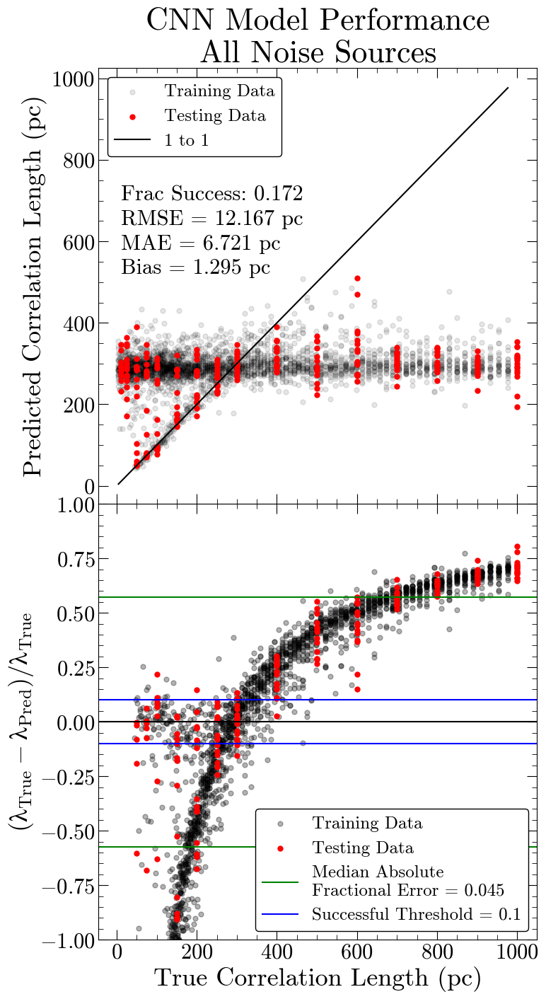

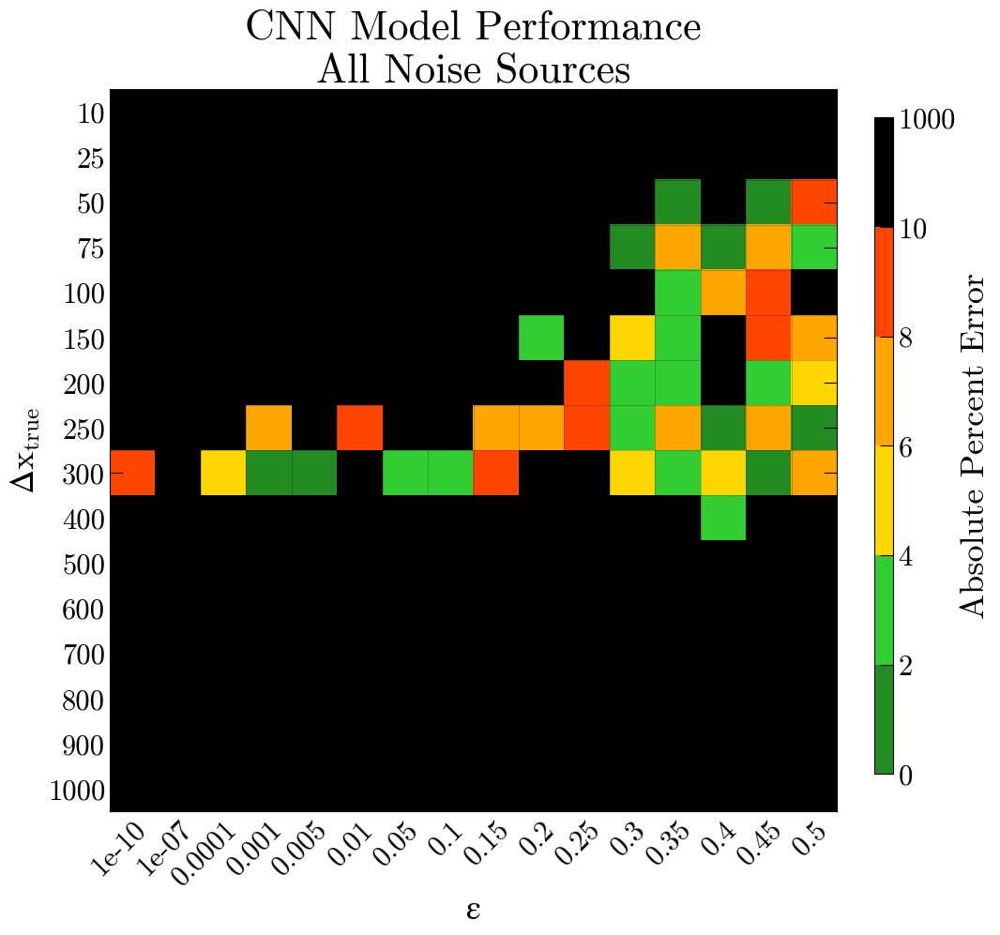

Number of squares with abs percent err>10%,  212


In [50]:
final_plot('08','CNN Model Performance\nAll Noise Sources',statdy=60)